<a href="https://colab.research.google.com/github/syriascitech/Computer_Vision_Course/blob/main/exercises/Week3/01_week3_review_solutions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div dir="rtl" style="text-align: right;">


<h1>🧪 مراجعة الأسبوع 3 — كشف الحواف، الفلترة، وكشف الحركة</h1>
<h3>جلسة تطبيقية مباشرة — 180 دقيقة</h3>
<p><em>نسخة الحلول والتفسيرات — تُشارَك بعد الجلسة الحيّة</em></p>


</div>

<div dir="rtl" style="text-align: right;">


<h2>عن هذا الدفتر</h2>
<p>هذا الدفتر مُعدّ لمراجعة عملية مكثّفة لما تعلّمته في الأسبوع 3: <strong>الفلترة (Filtering)</strong>،
<strong>كشف الحواف (Edge Detection)</strong>، و<strong>كشف الحركة (Motion Detection)</strong>.
لن تجد هنا شرحاً نظرياً جديداً — الهدف هو أن <strong>تكتب كوداً، تجرّب، تصحّح أخطاء، وتقارن نتائج</strong>
باستخدام نفس المفاهيم والدوال التي رأيتها في دفتر الأسبوع 3.</p>

<h3>🎓 أهداف الجلسة</h3>
<ul>
<li>ترسيخ فهمك لعمل الفلاتر (Gaussian, Median, Laplacian) ومتى تختار كلاً منها.</li>
<li>ممارسة كشف الحواف عملياً باستخدام <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel</code></span> و<span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Canny</code></span>، وفهم تأثير كل معامل.</li>
<li>تطبيق الطرق الثلاث لكشف الحركة (الفرق بين الإطارات، طرح الخلفية، التدفق البصري) ومقارنتها.</li>
<li>دمج المفاهيم الثلاثة معاً في خط أنابيب واحد (Pipeline)، كما رأينا في "الصورة الكبرى" بدفتر الأسبوع 3.</li>
</ul>

<h3>💡 عن التلميحات</h3>
<p>كل تمرين جوهري يحتوي على تلميحات <strong>تدريجية</strong> (تلميح 1 عام، وقد يليه تلميح أكثر تحديداً). حاول أولاً بدون فتحها،
وافتحها فقط عند الحاجة — التلميحات لا تعطيك الحل الجاهز.</p>


</div>

<div dir="rtl" style="text-align: right;">


<h3>📘 عن هذه النسخة — النسخة الكاملة</h3>
<p>هذه هي <strong>النسخة الكاملة</strong> من الجلسة: تحتوي على <strong>كل</strong> التمارين مع حلولها وتفسيراتها،
بما فيها التمارين التي لم تُدرَج في دفتر الطالب لتقصير الجلسة الحيّة.</p>
<p>تصنيف التمارين هنا:</p>
<ul>
<li><strong>⭐ أساسي — ضمن الجلسة:</strong> موجود في دفتر الطالب ونُنجزه معاً في القاعة.</li>
<li><strong>📘 في النسخة الكاملة فقط:</strong> تمرين أساسي جيد لكنه أُخرِج من دفتر الطالب حفاظاً على وقت الجلسة
(التمارين 8، 9، 11، 13). مناسب تماماً للمراجعة الذاتية بعد الجلسة.</li>
<li><strong>🚀 إضافي:</strong> تمارين توسّعية أعمق (15 وما بعدها) للمراجعة المنزلية.</li>
</ul>
<p>الترقيم هنا مطابق تماماً لترقيم دفتر الطالب، لذا فإن "تمرين 12" هنا هو نفسه "تمرين 12" هناك.</p>


</div>

<div dir="rtl" style="text-align: right;">


<h3>▶️ كيفية استخدام هذا الدفتر</h3>
<pre style="direction: ltr; text-align: left; background-color: rgba(128,128,128,0.12); padding: 12px; border-radius: 6px; font-family: monospace; white-space: pre-wrap;">
تمرين N — العنوان                 ⭐ أساسي  /  🧭 موجَّه
────────────────────────────────
الهدف + المهمة بالتفصيل
[ خلية كود مُعطاة — في التمارين الموجَّهة وتمارين التصحيح ]
تلميح 1 → تلميح 2 → تلميح 3 (تدريجية، اختيارية)
────────────────────────────────
[ خلية كود لحلّك أنت ]
[ خلية تحقّق ذاتي (اختيارية) ]
────────────────────────────────
</pre>


</div>

<div dir="rtl" style="text-align: right;">


<h2>🚀 التجهيز — شغّل هذا القسم أولاً</h2>
<p>القسم التالي يجهّز كل ما تحتاجه تلقائياً: يتحقق من مكتبات Python، ويحضّر الصور والفيديو المطلوبة سواء كنت
تعمل على <strong>Google Colab</strong> أو على نسخة محلية من المستودع. لا حاجة لأي إجراء يدوي — فقط شغّل الخلايا بالترتيب.</p>


</div>

In [1]:
import sys
IN_COLAB = "google.colab" in sys.modules
print("Google Colab:", "✅ نعم" if IN_COLAB else "❌ لا (بيئة محلية/Jupyter)")


Google Colab: ❌ لا (بيئة محلية/Jupyter)


In [2]:
import os
import subprocess
import urllib.request

REPO_URL = "https://github.com/syriascitech/Computer_Vision_Course.git"
REPO_DIR = "Computer_Vision_Course"
REQUIRED_ASSETS = ["aleppo_citadel.jpg", "aleppo_skyline.jpg", "passing_cars.mp4"]
RAW_BASE_URL = "https://raw.githubusercontent.com/syriascitech/Computer_Vision_Course/main/exercises/Week3/assets"

# 1) على Colab: نستنسخ المستودع مرة واحدة فقط (يحتوي كل الصور والفيديو المطلوبة جاهزة)
if IN_COLAB and not os.path.isdir(REPO_DIR):
    print("📥 جارٍ استنساخ مستودع الكورس (مرة واحدة فقط)...")
    subprocess.run(["git", "clone", "--depth", "1", REPO_URL, REPO_DIR], check=True)
    print("✅ تم الاستنساخ.")

# 2) نحدّد مجلد الموارد المناسب لبيئة التشغيل الحالية
if IN_COLAB:
    ASSETS_DIR = os.path.join(REPO_DIR, "exercises", "Week3", "assets")
elif os.path.isdir(os.path.join("exercises", "Week3", "assets")):
    ASSETS_DIR = os.path.join("exercises", "Week3", "assets")   # تشغيل من جذر المستودع
elif os.path.isdir("assets"):
    ASSETS_DIR = "assets"                                        # تشغيل من داخل exercises/Week3
else:
    ASSETS_DIR = "assets"
    os.makedirs(ASSETS_DIR, exist_ok=True)

# 3) خطة احتياطية: أي ملف غير موجود محلياً يتم تنزيله تلقائياً من GitHub
for name in REQUIRED_ASSETS:
    local_path = os.path.join(ASSETS_DIR, name)
    if not os.path.exists(local_path):
        try:
            print(f"📥 تنزيل {name} ...")
            urllib.request.urlretrieve(f"{RAW_BASE_URL}/{name}", local_path)
        except Exception as e:
            print(f"⚠️  تعذّر تنزيل '{name}': {e}")

CITADEL_PATH = os.path.join(ASSETS_DIR, "aleppo_citadel.jpg")
SKYLINE_PATH = os.path.join(ASSETS_DIR, "aleppo_skyline.jpg")
VIDEO_PATH = os.path.join(ASSETS_DIR, "passing_cars.mp4")

print("📁 مجلد الموارد المستخدم:", ASSETS_DIR)


📁 مجلد الموارد المستخدم: assets


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("NumPy:", np.__version__)
print("OpenCV:", cv2.__version__)
print("Matplotlib:", __import__("matplotlib").__version__)


NumPy: 2.3.5
OpenCV: 5.0.0
Matplotlib: 3.10.6


In [4]:
# فحص نهائي: هل الملفات موجودة، وهل يمكن قراءتها فعلاً (لا نتحقق من الوجود فقط)؟
_all_ok = True
for label, path in [("صورة قلعة حلب", CITADEL_PATH),
                     ("صورة أفق مدينة حلب", SKYLINE_PATH),
                     ("فيديو السيارات", VIDEO_PATH)]:
    if not os.path.exists(path):
        print(f"❌ لم يتم العثور على: {label} ({path})")
        _all_ok = False
        continue
    if path.endswith(".mp4"):
        _cap = cv2.VideoCapture(path)
        _readable = _cap.isOpened() and _cap.read()[0]
        _cap.release()
    else:
        _readable = cv2.imread(path) is not None
    if _readable:
        print(f"✅ {label}: تم التحقق من القراءة بنجاح")
    else:
        print(f"❌ {label}: الملف موجود لكن تعذّرت قراءته")
        _all_ok = False

print()
if _all_ok:
    print("✅ اكتمل التجهيز بنجاح — يمكنك الآن البدء بالتمارين.")
else:
    print("❌ هناك مشكلة في أحد الموارد. أعد تشغيل الخلايا أعلاه، أو تواصل مع المدرّب.")


✅ صورة قلعة حلب: تم التحقق من القراءة بنجاح
✅ صورة أفق مدينة حلب: تم التحقق من القراءة بنجاح
✅ فيديو السيارات: تم التحقق من القراءة بنجاح

✅ اكتمل التجهيز بنجاح — يمكنك الآن البدء بالتمارين.


<div dir="rtl" style="text-align: right;">


<h3>🧰 أدوات مساعدة (مُعطاة جاهزة — ليست جزءاً من التمارين)</h3>
<p>الدوال التالية تسهّل عرض الصور ومقارنتها ومعالجة الفيديو، وستستخدمها كثيراً في التمارين القادمة.
لا تحتاج لفهم تفاصيلها البرمجية — فقط اعرف ماذا تفعل كل دالة.</p>


</div>

In [5]:
def show_images(images, titles=None, cmaps=None, figsize=None, suptitle=None):
    """يعرض عدة صور جنباً إلى جنب لمقارنتها بصرياً."""
    n = len(images)
    titles = titles or [""] * n
    cmaps = cmaps or [None] * n
    figsize = figsize or (5 * n, 5)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for ax, img, title, cmap in zip(axes, images, titles, cmaps):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=11)
        ax.axis("off")
    if suptitle:
        fig.suptitle(suptitle, fontsize=13)
    plt.tight_layout()
    plt.show()


def to_rgb(img_bgr):
    """تحويل صورة من BGR (ترتيب OpenCV) إلى RGB (ترتيب Matplotlib) للعرض الصحيح."""
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)


def add_salt_and_pepper_noise(gray_img, amount=0.03, seed=42):
    """يضيف ضوضاء Salt-and-Pepper (بكسلات بيضاء/سوداء عشوائية معزولة) لصورة رمادية.
    أداة مساعدة لتوليد بيانات تجربة فقط - ليست جزءاً من مفاهيم الأسبوع 3."""
    rng = np.random.default_rng(seed)
    noisy = gray_img.copy()
    h, w = noisy.shape
    n_pixels = int(amount * h * w)
    ys = rng.integers(0, h, n_pixels)
    xs = rng.integers(0, w, n_pixels)
    salt = rng.random(n_pixels) > 0.5
    noisy[ys[salt], xs[salt]] = 255
    noisy[ys[~salt], xs[~salt]] = 0
    return noisy


def read_video_frames(path, max_frames=60):
    """يقرأ أول max_frames إطار من فيديو ويعيدها كقائمة مصفوفات BGR."""
    cap = cv2.VideoCapture(path)
    frames = []
    while cap.isOpened() and len(frames) < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(frame)
    cap.release()
    return frames


print("🧰 الأدوات المساعدة جاهزة: show_images, to_rgb, add_salt_and_pepper_noise, read_video_frames")


🧰 الأدوات المساعدة جاهزة: show_images, to_rgb, add_salt_and_pepper_noise, read_video_frames


<div dir="rtl" style="text-align: right;">


<h3>🖼️ تحميل الصورة الرئيسية للجلسة</h3>
<p>سنستخدم صورة <strong>قلعة حلب</strong> كصورة رئيسية لتمارين الفلترة وكشف الحواف
(تفاصيلها الحجرية والهندسية الغنية مثالية لهذا النوع من التمارين)، وصورة
<strong>أفق مدينة حلب القديمة</strong> في تمارين لاحقة.</p>


</div>

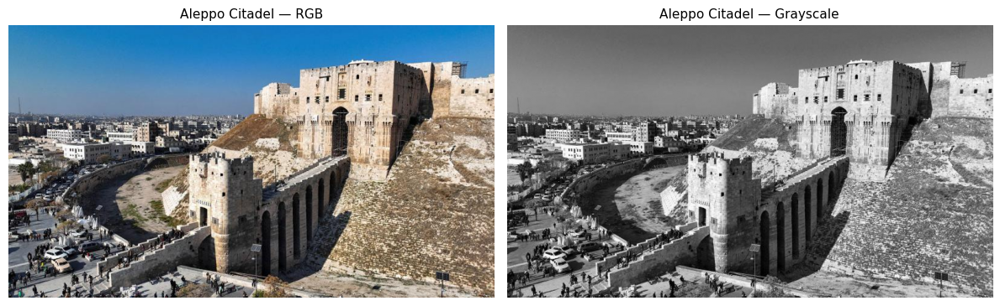

shape: (450, 800, 3) | dtype: uint8


In [6]:
img_bgr = cv2.imread(CITADEL_PATH)
img_rgb = to_rgb(img_bgr)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

show_images([img_rgb, img_gray], ["Aleppo Citadel — RGB", "Aleppo Citadel — Grayscale"],
            cmaps=[None, "gray"], figsize=(12, 5))
print("shape:", img_bgr.shape, "| dtype:", img_bgr.dtype)


<div dir="rtl" style="text-align: right;">


<h2>🧠 استرجاع نشط سريع (≈15 دقيقة)</h2>
<p>قبل أن نبدأ، دعنا "نُعيد تشغيل" ذاكرتنا حول مفاهيم الأسبوع 3. هذا ليس اختباراً — فكّر بصوت مرتفع مع زملائك
والمدرّب، وناقش إجابتك <strong>قبل</strong> فتح "الإجابة". الهدف هو التذكّر النشط، لا القراءة السلبية.</p>


</div>

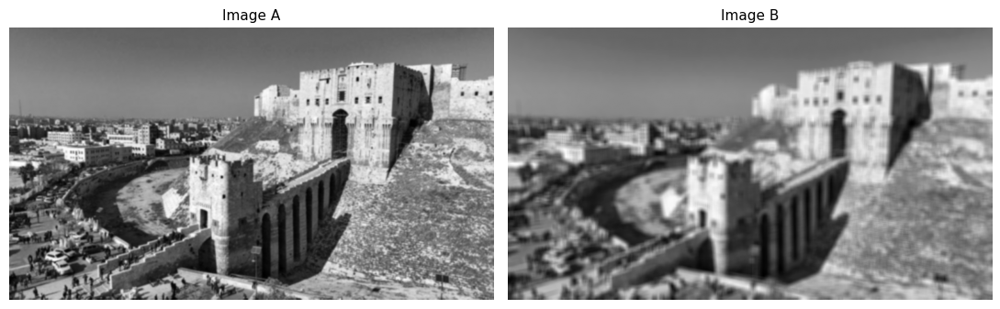

In [7]:
# 🎬 مثال بصري: نفس الصورة بعد فلتر Gaussian بقيمتين مختلفتين لـ σ (السيجما)
_demo_a = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=1)
_demo_b = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=8)
show_images([_demo_a, _demo_b], ["Image A", "Image B"], cmaps=["gray", "gray"], figsize=(11, 5))


<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>1.</strong> انظر إلى الصورتين A و B أعلاه؛ كلاهما نتيجة فلتر Gaussian لكن بقيمة σ مختلفة. أيّهما استخدمت σ أكبر، A أم B؟ وما الدليل البصري؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

الصورة B استخدمت <span dir="ltr" style="unicode-bidi: isolate;"><code>sigmaX=8</code></span> (أكبر)، والصورة A استخدمت <span dir="ltr" style="unicode-bidi: isolate;"><code>sigmaX=1</code></span>. كلما كبرت σ، اتسع منحنى Gaussian فأصبح كل بكسل يتأثر بجيران أبعد، فيزداد التمويه وتضيع التفاصيل الدقيقة (الحجارة الصغيرة في B صارت كتلة ضبابية واحدة تقريباً).

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>2.</strong> صحيح أم خاطئ: يمكن اعتبار خوارزمية Canny "فلتراً واحداً" بسيطاً مثل Gaussian أو Median؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

خاطئ. Canny ليست فلتراً واحداً بل <strong>خط أنابيب من 5 مراحل</strong>: (1) تمهيد بـ Gaussian، (2) حساب التدرّج بـ Sobel، (3) <span dir="ltr" style="unicode-bidi: isolate;"><code>Non-Maximum Suppression</code></span> لتنحيف الحواف، (4) عتبة مزدوجة (Low/High)، (5) تتبّع الحواف الضعيفة المتصلة بحواف قوية (Hysteresis).

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>3.</strong> لاحظ هذا السطر الذي يتكرر قبل أي عملية كشف حواف تقريباً: <span dir="ltr" style="unicode-bidi: isolate;"><code>gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)</code></span>. لماذا نحوّل إلى Grayscale أولاً بدل العمل على الصورة الملوّنة مباشرة؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

لأن الحافة تُعرَّف كتغيّر مفاجئ في <strong>شدة الإضاءة (Intensity)</strong>، والألوان لا تضيف معلومة ضرورية لهذا الغرض بل تُبطّئ الحساب (3 قنوات بدل قناة واحدة → توفير يقارب 66% من الحساب).

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>4.</strong> لو ظهرت في صورة نقاط بيضاء/سوداء معزولة وعشوائية منتشرة (Salt-and-Pepper Noise)، أي فلتر من فلاتر الأسبوع 3 الثلاثة هو الأنسب؟ ولماذا لا يُعالج Gaussian هذه المشكلة جيداً؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

الفلتر الأنسب هو <strong>Median</strong>، لأنه يعتمد على <strong>الترتيب الإحصائي</strong> (يأخذ القيمة الوسطى من الجيران) فتُرمى القيم الشاذة (0 أو 255) تلقائياً إلى طرفي القائمة المرتّبة ولا تصل غالباً للوسط. أما Gaussian فهو <strong>متوسط مرجّح</strong> — فيُدرِج القيمة الشاذة في الحساب ويُلطّخ محيطها بها بدل حذفها.

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>5.</strong> ماذا يمثّل "التدرّج" (Gradient) في صورة؟ وماذا يعني أن تكون قيمته كبيرة في منطقة معيّنة؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

التدرّج هو <strong>المشتقّ (Derivative)</strong> للصورة — يقيس سرعة/حجم تغيّر شدة الإضاءة بين بكسل وجيرانه. قيمة تدرّج كبيرة تعني تغيّراً حاداً ومفاجئاً في الإضاءة، وهذا بالتعريف هو ما نبحث عنه لتحديد <strong>الحافة</strong>.

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>6.</strong> الفيديو هو أساساً سلسلة إطارات (صور) متتالية. ما العملية الأساسية بين إطارين متتاليين التي تكشف وجود حركة؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

<strong>الفرق المطلق بين الإطارين</strong>: <span dir="ltr" style="unicode-bidi: isolate;"><code>D = |I(t) - I(t-1)|</code></span>، ثم تطبيق عتبة (Threshold) على هذا الفرق. المناطق الثابتة يقترب فرقها من الصفر (تختفي)، والمناطق التي تحرّك فيها جسم يظهر فيها فرق كبير.

</details>

</div>

<div dir="rtl" style="text-align: right;">

<p style="font-size:1.05em;"><strong>7.</strong> بحسب "الصورة الكبرى" في ختام دفتر الأسبوع 3: ما الترتيب المنطقي الأفضل لخط أنابيب كاميرا مراقبة ذكية؟ تصفية ← حركة ← حواف، أم حواف ← حركة ← تصفية؟ ولماذا؟</p>

</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 الإجابة 1</strong></summary>

<strong>تصفية ← حركة ← حواف</strong>. بدون تصفية أولاً، ستفشل خوارزميات كشف الحركة بسبب ضجيج الكاميرا. وبدون كشف الحركة كخطوة ثانية لتضييق الانتباه على المنطقة المهمة زمنياً، ستتشتّت خوارزمية كشف الحواف بتفاصيل الخلفية الثابتة غير المهمة.

</details>

</div>

<div dir="rtl" style="text-align: right;">


<h1>🧱 الجزء الأول — الفلترة (Filtering)</h1>
<p>في هذا الجزء سنُطبّق ونُقارن الفلاتر الثلاثة التي رأيتها في الأسبوع 3: <strong>Gaussian</strong>، <strong>Median</strong>،
و<strong>Laplacian</strong> — تماماً كما ناقشنا في "القاعدة الذهبية" لاختيار الفلتر المناسب.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 1 — تجربة مصغّرة: تأثير σ في فلتر Gaussian</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> تجربة مصغّرة (Mini Experiment) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 10 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟢 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ربط معامل σ (سيجما) بالتأثير البصري الفعلي للتمويه، عبر تجربة تُصمّمها أنت بنفسك.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>باستخدام <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.GaussianBlur</code></span> على <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span>، وبنفس حجم النواة <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize=(9, 9)</code></span>، طبّق الفلتر
ثلاث مرات بقيم <span dir="ltr" style="unicode-bidi: isolate;"><code>sigmaX</code></span> مختلفة: <strong>1</strong>، <strong>4</strong>، <strong>10</strong>.</li>
<li>اعرض الصورة الأصلية والثلاث نتائج معاً باستخدام <span dir="ltr" style="unicode-bidi: isolate;"><code>show_images</code></span> مع عناوين تحتوي قيمة σ المستخدمة.</li>
<li>قبل أن تصف النتيجة كتابياً: هل الفرق بين σ=1 وσ=4 يبدو بنفس مقدار الفرق بين σ=4 وσ=10؟ لماذا؟</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

الاستدعاء الأساسي: <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.GaussianBlur(src, ksize, sigmaX)</code></span>. ksize يبقى ثابتاً <span dir="ltr" style="unicode-bidi: isolate;"><code>(9,9)</code></span> في الثلاث تجارب — المتغيّر الوحيد هو sigmaX.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>show_images([img_gray, blur1, blur4, blur10], [...])</code></span> لعرض الأربع صور دفعة واحدة.

</details>

</div>

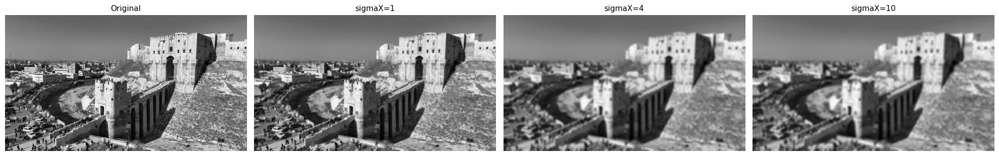

std(original)  = 59.04
std(sigma=1)   = 53.61
std(sigma=4)   = 49.27
std(sigma=10)  = 48.89


In [8]:
blur_s1 = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=1)
blur_s4 = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=4)
blur_s10 = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=10)

show_images(
    [img_gray, blur_s1, blur_s4, blur_s10],
    ["Original", "sigmaX=1", "sigmaX=4", "sigmaX=10"],
    cmaps=["gray"] * 4, figsize=(20, 5),
)
print("std(original)  =", round(float(img_gray.std()), 2))
print("std(sigma=1)   =", round(float(blur_s1.std()), 2))
print("std(sigma=4)   =", round(float(blur_s4.std()), 2))
print("std(sigma=10)  =", round(float(blur_s10.std()), 2))


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>Sigma تُحدّد <strong>عرض</strong> منحنى Gaussian: كل ما كبرت σ، اتسع المنحنى وأصبحت الأوزان مُوزّعة على مساحة أكبر
من الجيران بدل التركّز حول المركز — لهذا التمويه لا يزداد بشكل خطّي: الفرق بين σ=1 وσ=4 يكون أوضح بصرياً من الفرق
بين σ=4 وσ=10 لأن التمويه عند σ=4 "يستهلك" أغلب التفاصيل الدقيقة المتبقية أصلاً، فزيادة σ بعدها تُنتج تغيّراً أقل وضوحاً بالعين
رغم أنه أكبر رياضياً. لاحظ أن <span dir="ltr" style="unicode-bidi: isolate;"><code>std()</code></span> (الانحراف المعياري) يقلّ تدريجياً كدليل كمّي على أن التباين العام في شدة البكسلات يتراجع مع التمويه.</p>
<h4>أخطاء شائعة</h4>
<ul>
<li>نسيان أن <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span> يجب أن يكون فردياً في كل بُعد (مثل (9,9))، وليس (8,8).</li>
<li>الخلط بين <span dir="ltr" style="unicode-bidi: isolate;"><code>sigmaX</code></span> و<span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span>: زيادة <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span> فقط دون <span dir="ltr" style="unicode-bidi: isolate;"><code>sigmaX</code></span> كافٍ لا تُنتج بالضرورة تمويهاً أقوى بنفس الطريقة.</li>
</ul>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 2 — تصحيح الأخطاء: الفلتر الخاطئ لضوضاء Salt-and-Pepper</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> تصحيح أخطاء (Debugging) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> التعرّف على قصور Gaussian في إزالة الضوضاء الدفعية (Salt-and-Pepper) عملياً، واختيار الفلتر المناسب فعلاً بدل النظري فقط.</p>
<div dir="rtl" style="text-align: right;">


<h3>السيناريو</h3>
<p>أحد المتدرّبين كتب الكود التالي (الخلية أدناه) بهدف "تنظيف" صورة من ضجيج Salt-and-Pepper. الكود <strong>يعمل بلا أي خطأ برمجي</strong>.</p>
<h3>المهمة</h3>
<ol>
<li>شغّل الخلية التالية أولاً وتأمّل النتيجة بعناية — هل الصورة "المنظّفة" نظيفة فعلاً من النقاط الشاذة؟</li>
<li>صف بدقة ما تراه في الصورة الناتجة (ليس فقط "غير جيدة" — ماذا تحديداً حدث للنقاط البيضاء/السوداء؟).</li>
<li>أعد كتابة خط المعالجة في خلية حلّك باستخدام فلتر <strong>مختلف</strong> من فلاتر الأسبوع 3 يكون مناسباً لهذا النوع من الضجيج تحديداً.</li>
<li>اعرض الثلاث صور معاً: الأصلية المُشوَّشة، نتيجة Gaussian (الخاطئة)، ونتيجتك الجديدة.</li>
</ol>


</div>
</div>

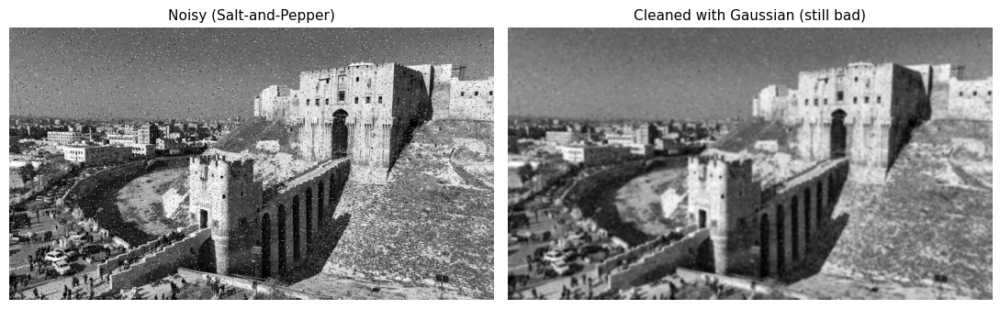

In [9]:
# --- الكود المُعطى (يعمل بلا أخطاء، لكن النتيجة ضعيفة) — شغّل هذه الخلية أولاً ---
noisy_citadel = add_salt_and_pepper_noise(img_gray, amount=0.03)
gaussian_cleaned = cv2.GaussianBlur(noisy_citadel, (7, 7), 0)
show_images([noisy_citadel, gaussian_cleaned], ["Noisy (Salt-and-Pepper)", "Cleaned with Gaussian (still bad)"],
            cmaps=["gray", "gray"], figsize=(11, 5))


<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

فكّر في نوع الضجيج: هل هو تدرّج خفيف موزّع على كل بكسل بانتظام، أم نقاط معزولة متطرّفة (0 أو 255) وسط بكسلات طبيعية؟

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

أي الفلاتر الثلاثة في الأسبوع 3 يعتمد على <strong>الترتيب الإحصائي</strong> بدل <strong>المتوسط المرجّح</strong>؟ راجع "القاعدة الذهبية".

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

الدالة المكافئة في OpenCV لهذا الفلتر لم تُستخدَم بعد في هذا الدفتر، لكن اسمها منطقي جداً بالإنجليزية ويبدأ بالكلمة median. جرّب البحث عنها في توثيق OpenCV.

</details>

</div>

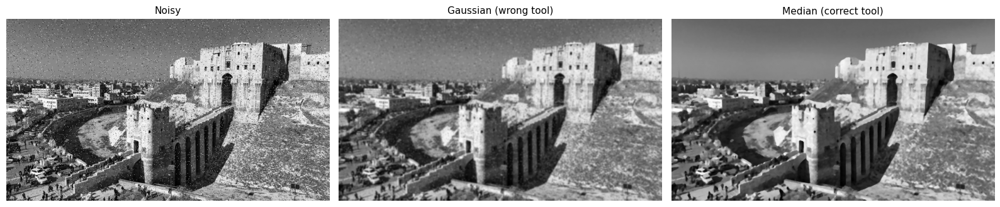

In [10]:
# --- الحل: استخدام Median بدل Gaussian ---
your_cleaned = cv2.medianBlur(noisy_citadel, 5)

show_images(
    [noisy_citadel, gaussian_cleaned, your_cleaned],
    ["Noisy", "Gaussian (wrong tool)", "Median (correct tool)"],
    cmaps=["gray"] * 3, figsize=(16, 5),
)


<div dir="rtl" style="text-align: right;">


<h4>لماذا فشل Gaussian؟</h4>
<p>Gaussian يحسب <strong>متوسطاً مرجّحاً</strong> لجيران كل بكسل. حين يكون أحد الجيران قيمته 255 (شاذة تماماً)، فإنه
"يُلوّث" المتوسط ويُنتج بقعة رمادية باهتة حول موضع كل نقطة شاذة بدل حذفها — لهذا كانت النتيجة "بقع مموّهة" لا "نظافة حقيقية".</p>
<h4>لماذا نجح Median؟</h4>
<p><span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.medianBlur(src, ksize)</code></span> يفرز قيم الجيران ويختار <strong>القيمة الوسطى</strong> فقط. القيم الشاذة (0 أو 255) تنحدر
دائماً إلى طرفي القائمة المرتّبة، فلا تصل غالباً للمنتصف — وهذا يعني حذفها الفعلي بدل تخفيفها. هذا تماماً ما شرحه
دفتر الأسبوع 3 بالمثال العددي اليدوي (المصفوفة 3×3 وفيها القيمة 255 الشاذة).</p>
<h4>أخطاء شائعة</h4>
<ul>
<li>الاعتقاد بأن "أي فلتر تمويه" يحل مشكلة الضجيج — نوع الضجيج يحدّد الفلتر المناسب.</li>
<li>استخدام <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span> كبير جداً في <span dir="ltr" style="unicode-bidi: isolate;"><code>medianBlur</code></span> فيبدأ الفلتر بتشويه التفاصيل الحقيقية أيضاً.</li>
</ul>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 3 — إكمال المرحلة الناقصة: فلتر Laplacian عبر OpenCV</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> إكمال مرحلة ناقصة (Complete the Missing Stage) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 10 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ترجمة نظرية Laplacian (المشتقّ الثاني، النواة صفرية المجموع) التي رأيتها في الأسبوع 3 إلى استدعاء فعلي لـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Laplacian</code></span> — لم يُستخدَم هذا الاستدعاء في دفتر الأسبوع 3 إطلاقاً، فقط نظرياً.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>طبّق تمهيداً خفيفاً بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.GaussianBlur</code></span> على <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span> بنواة صغيرة (3×3) لتقليل الضجيج قبل حساب المشتقّ الثاني.</li>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Laplacian</code></span> على الصورة الممهَّدة.</li>
<li><strong>فكّر جيداً في نوع البيانات (dtype)</strong> الذي تمرّره وتستقبله — راجع تلميح 1 إن لم تكن متأكداً.</li>
<li>حوّل الناتج إلى صورة قابلة للعرض (uint8) واعرضها بجانب الصورة الرمادية الأصلية.</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

المشتقّ الثاني قد يُعطي قيماً <strong>سالبة</strong> (تغيّر في اتجاه معيّن) وقيماً موجبة. هل نوع البيانات <span dir="ltr" style="unicode-bidi: isolate;"><code>uint8</code></span> يستطيع تخزين قيمة سالبة؟ ماذا يحدث إن حاولت تخزين -50 في <span dir="ltr" style="unicode-bidi: isolate;"><code>uint8</code></span>؟

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

مرّر <span dir="ltr" style="unicode-bidi: isolate;"><code>ddepth=cv2.CV_64F</code></span> إلى <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Laplacian</code></span> لتحصل على قيم عشرية موجبة وسالبة بلا فقدان بيانات، ثم فكّر كيف تُحوِّل هذه القيم (بعضها سالب) إلى صورة uint8 قابلة للعرض بلا التفاف (Overflow).

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

الدالة <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.convertScaleAbs(x)</code></span> تأخذ القيمة المطلقة وتُحوّل تلقائياً وبأمان إلى uint8 — بديل عملي لـ <span dir="ltr" style="unicode-bidi: isolate;"><code>np.abs(x).astype(np.uint8)</code></span> مع نفس الفكرة.

</details>

</div>

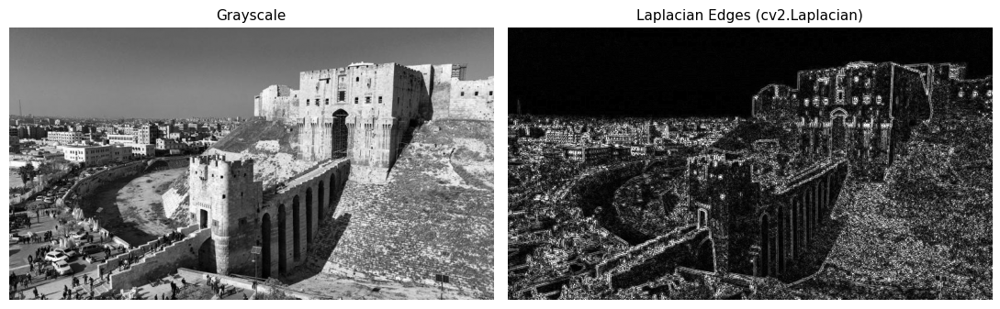

min/max في القيم الخام (float64): -498.0 544.0
min/max بعد convertScaleAbs (uint8): 0 255


In [11]:
blurred_for_lap = cv2.GaussianBlur(img_gray, (3, 3), 0)
laplacian_raw = cv2.Laplacian(blurred_for_lap, cv2.CV_64F, ksize=3)
laplacian_display = cv2.convertScaleAbs(laplacian_raw)

show_images([img_gray, laplacian_display], ["Grayscale", "Laplacian Edges (cv2.Laplacian)"],
            cmaps=["gray", "gray"], figsize=(11, 5))

print("min/max في القيم الخام (float64):", laplacian_raw.min(), laplacian_raw.max())
print("min/max بعد convertScaleAbs (uint8):", laplacian_display.min(), laplacian_display.max())


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>نواة Laplacian التي رأيناها بالأسبوع 3 (0,-1,0 / -1,4,-1 / 0,-1,0) مجموع عناصرها صفر، مما يعني أن نتيجتها تحتوي
قيماً سالبة وموجبة معاً حول الصفر. لو استخدمنا <span dir="ltr" style="unicode-bidi: isolate;"><code>ddepth=cv2.CV_8U</code></span> مباشرة (نوع uint8)، فإن أي قيمة سالبة
"تلتف" (Overflow) وتتحوّل لقيمة كبيرة خاطئة قريبة من 255 بدل أن تُقصّ إلى صفر بشكل صحيح — تماماً كمشكلة
overflow نفسها التي رأيتها في تمارين ضبط السطوع بالأسبوع الأول. الحل: العمل بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>CV_64F</code></span> أولاً (يحفظ القيم كما هي)،
ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>convertScaleAbs</code></span> في النهاية يأخذ القيمة المطلقة ويحوّل بأمان لـ uint8 قابل للعرض.</p>
<h4>أخطاء شائعة</h4>
<ul>
<li>استخدام <span dir="ltr" style="unicode-bidi: isolate;"><code>ddepth=cv2.CV_8U</code></span> مباشرة فتظهر نتائج غريبة ومبقّعة بسبب الالتفاف.</li>
<li>نسيان التمهيد بـ Gaussian قبل Laplacian — بدونه تكون النتيجة شديدة الحساسية للضجيج (Laplacian مشتقّ ثانٍ، أكثر حساسية للضجيج من Sobel).</li>
</ul>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 4 — قارن واختر: Gaussian ضد Median ضد Laplacian</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> مقارنة واتخاذ قرار (Compare & Decide) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 15 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ترسيخ "القاعدة الذهبية" لاختيار الفلتر المناسب عبر مقارنة مباشرة للثلاثة فلاتر على نفس الصورة المشوَّشة، وتبرير القرار — لا يوجد إجابة واحدة صحيحة، بل تبرير منطقي.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>طبّق الفلاتر الثلاثة (Gaussian, Median, Laplacian) على <span dir="ltr" style="unicode-bidi: isolate;"><code>noisy_citadel</code></span> (نفس الصورة المشوَّشة من تمرين 2).</li>
<li>اعرض الأربع صور (الأصلية المشوَّشة + الثلاث نتائج) في شبكة واحدة.</li>
<li>أجب كتابياً (في خلية حلّك، كتعليقات) على الأسئلة الثلاثة التالية:</li>
</ol>
<ul>
<li>أي فلتر تختاره إن كان الهدف <strong>تقليل الضجيج فقط</strong> دون تغيير شكل الحواف الأصلية؟</li>
<li>أي فلتر تختاره إن كان الهدف <strong>تسليط الضوء على الحواف بسرعة</strong> دون الاهتمام بالتمويه؟</li>
<li>لماذا لا يُفضَّل تطبيق Laplacian <strong>مباشرة</strong> على صورة تحتوي ضجيج Salt-and-Pepper، رغم أنه "يكشف حواف"؟</li>
</ul>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

استخدم نتائجك الجاهزة من تمرين 2 (Median) وتمرين 3 (Laplacian) لتقليل التكرار — لا حاجة لإعادة كتابة كل شيء من الصفر.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

فكّر في "القاعدة الذهبية" التي رأيتها بالأسبوع 3: كل فلتر صُمّم لمشكلة مختلفة، وليس هناك "الأفضل" المطلق.

</details>

</div>

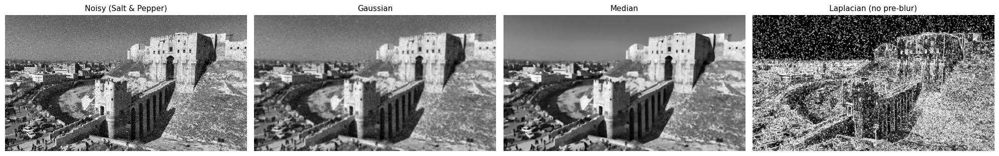

In [12]:
gaussian_result = cv2.GaussianBlur(noisy_citadel, (7, 7), 0)
median_result = cv2.medianBlur(noisy_citadel, 5)
lap = cv2.Laplacian(noisy_citadel, cv2.CV_64F, ksize=3)
laplacian_result = cv2.convertScaleAbs(lap)

show_images(
    [noisy_citadel, gaussian_result, median_result, laplacian_result],
    ["Noisy (Salt & Pepper)", "Gaussian", "Median", "Laplacian (no pre-blur)"],
    cmaps=["gray"] * 4, figsize=(20, 5),
)


<div dir="rtl" style="text-align: right;">


<h4>إجابات مقترحة للنقاش</h4>
<ul>
<li><strong>تقليل الضجيج دون تغيير الحواف:</strong> Median — يحافظ على حدّة الحواف الحقيقية بشكل أفضل من Gaussian
لأنه لا "يمزج" قيم البكسلات، بل يختار قيمة موجودة فعلاً من الجيران.</li>
<li><strong>تسليط الضوء على الحواف بسرعة:</strong> Laplacian — نواة ثابتة واحدة، حساب مباشر وسريع لكل الاتجاهات معاً،
مناسب حين لا يهمّنا التمويه المسبق.</li>
<li><strong>لماذا لا نطبّق Laplacian مباشرة على ضجيج Salt-and-Pepper:</strong> Laplacian هو مشتقّ ثانٍ، وهو حسّاس
جداً للتغيّرات الحادة — وكل نقطة ضجيج معزولة هي بالتعريف "تغيّر حادّ مفاجئ"! لذلك Laplacian سيُضخّم كل نقطة ضجيج
ويعاملها كحافة حقيقية، منتجاً صورة أسوأ من الأصل بدل حواف نظيفة (لاحظ في الصورة الرابعة أعلاه كيف امتلأت الصورة
بنقاط بيضاء صغيرة كثيرة). الحل الصحيح: تنظيف الضجيج (Median) أولاً، ثم Laplacian أو Sobel/Canny على الناتج النظيف.</li>
</ul>


</div>

<div dir="rtl" style="text-align: right;">


<h2>☕ استراحة قصيرة (10 دقائق)</h2>
<p>أنهينا الجزء الأول (الفلترة). في الجزء القادم سننتقل إلى <strong>كشف الحواف</strong> — Sobel وCanny.
عد بعد 10 دقائق!</p>


</div>

<div dir="rtl" style="text-align: right;">


<h1>🔍 الجزء الثاني — كشف الحواف (Edge Detection)</h1>
<p>سننتقل الآن من "تحسين الصورة" إلى "استخراج معنى منها": أين توجد الحواف؟ سنستخدم Sobel وCanny،
تماماً كما تعلّمت في الأسبوع 3، لكن بترجمة عملية مباشرة إلى استدعاءات OpenCV.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 5 — تحقيق في الكود: <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel</code></span> مقابل الحدس اليدوي</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> تحقيق في الكود (Code Investigation) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ترجمة صيغة Sobel اليدوية (Gx, Gy, المقدار) التي بنيتها بالأسبوع 3 من الصفر إلى استدعاء مباشر لـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel</code></span> — لم تُستخدَم هذه الدالة كاستدعاء فعلي في دفتر الأسبوع 3، فقط النسخة اليدوية.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel</code></span> لحساب Gx (التدرّج بالاتجاه الأفقي) وGy (بالاتجاه الرأسي) على <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span>.</li>
<li>اجمعهما بنفس الصيغة الرياضية التي رأيتها بالأسبوع 3 لحساب <strong>المقدار (Magnitude)</strong>: <span dir="ltr" style="unicode-bidi: isolate;"><code>sqrt(Gx² + Gy²)</code></span>.</li>
<li>اعرض Gx، Gy، والمقدار جنباً إلى جنب مع الصورة الأصلية.</li>
<li>قارن بمنطقك: هل Gx يُبرز الحواف الرأسية أم الأفقية؟ لماذا (فكّر في اتجاه التغيّر الذي يقيسه Gx)؟</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

الدالة المكافئة لصيغة Gx/Gy اليدوية هي <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel(src, ddepth, dx, dy, ksize)</code></span>. تحتاج نفس احتياط نوع البيانات الذي رأيته في تمرين 3 (Laplacian) — القيم قد تكون سالبة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

لحساب Gx ضع <span dir="ltr" style="unicode-bidi: isolate;"><code>dx=1, dy=0</code></span>. لحساب Gy ضع العكس <span dir="ltr" style="unicode-bidi: isolate;"><code>dx=0, dy=1</code></span>.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

لدمج Gx وGy: <span dir="ltr" style="unicode-bidi: isolate;"><code>magnitude = np.sqrt(gx**2 + gy**2)</code></span>، بالضبط كما فعلت يدوياً بالأسبوع 3 — الفرق الوحيد أن Gx وGy جاءا من دالة جاهزة بدل حلقة for يدوية.

</details>

</div>

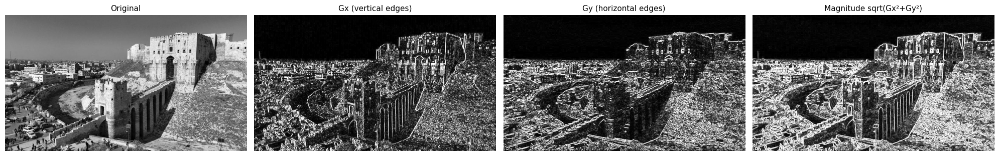

In [13]:
gx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
gy = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
magnitude = np.sqrt(gx ** 2 + gy ** 2)

gx_display = cv2.convertScaleAbs(gx)
gy_display = cv2.convertScaleAbs(gy)
magnitude_display = cv2.convertScaleAbs(magnitude)

show_images(
    [img_gray, gx_display, gy_display, magnitude_display],
    ["Original", "Gx (vertical edges)", "Gy (horizontal edges)", "Magnitude sqrt(Gx²+Gy²)"],
    cmaps=["gray"] * 4, figsize=(20, 5),
)


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p><span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Sobel</code></span> يُنفّذ بالضبط عملية الالتفاف بنواة Sobel التي بنيتها يدوياً بالأسبوع 3 (<span dir="ltr" style="unicode-bidi: isolate;"><code>Gx</code></span> تقيس التغيّر الأفقي
فتُبرز <strong>الحواف الرأسية</strong> — الحدود بين الحجارة عمودياً مثلاً — وGy تقيس التغيّر الرأسي فتُبرز <strong>الحواف الأفقية</strong>).
هذا يوضّح أن ما تعلّمته "من الصفر" ليس مجرد تمرين أكاديمي منفصل، بل هو <em>تحديداً</em> ما تُنفّذه الدالة الجاهزة داخلياً
وبشكل أسرع بكثير (مكتوبة بلغة C++ محسّنة بدل حلقة Python).</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 6 — توقّع ← نفّذ ← فسّر: Canny بدون تمهيد Gaussian</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> توقّع ثم نفّذ (Predict → Run → Explain) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 10 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟢 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> فهم السبب العملي وراء كون Canny خط أنابيب من 5 مراحل يبدأ بالتمهيد، لا خوارزمية كشف حواف مباشرة على الصورة الخام.</p>
<div dir="rtl" style="text-align: right;">


<h3>الخطوة 1 — توقّع (قبل تشغيل أي كود!)</h3>
<p>بالرجوع لجدول مراحل Canny الخمس بالأسبوع 3: ماذا تتوقع أن يحدث لو طبّقنا <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Canny</code></span> مباشرة على
<span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span> <strong>بدون</strong> أي تمهيد <span dir="ltr" style="unicode-bidi: isolate;"><code>Gaussian</code></span> مسبق، بنفس العتبات <span dir="ltr" style="unicode-bidi: isolate;"><code>(50, 150)</code></span> المستخدمة بالدفتر؟
اكتب توقّعك في تعليق قبل تشغيل الكود.</p>
<h3>الخطوة 2 — نفّذ وقارن</h3>
<ol>
<li>احسب Canny على <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span> مباشرة بدون تمهيد.</li>
<li>احسب Canny أيضاً بعد تمهيد بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.GaussianBlur(img_gray, (5,5), 0)</code></span> (كما بدفتر الأسبوع 3).</li>
<li>اعرض النتيجتين جنباً إلى جنب.</li>
</ol>
<h3>الخطوة 3 — فسّر</h3>
<p>هل تطابق توقّعك مع الناتج الفعلي؟ ما العلاقة بين هذه النتيجة والمرحلة الأولى من مراحل Canny الخمس؟</p>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

هذا تحديداً هو التمرين الذي تركه دفتر الأسبوع 3 بلا حل في آخره — راجع تلك الفكرة إن كنت متردداً.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

فكّر في مصدر الضجيج في أي صورة حقيقية (حبيبات الكاميرا، إضاءة غير مثالية) — وماذا يحدث حين نحسب مشتقّاً (تدرّجاً) لصورة تحتوي ضجيجاً عالي التردد.

</details>

</div>

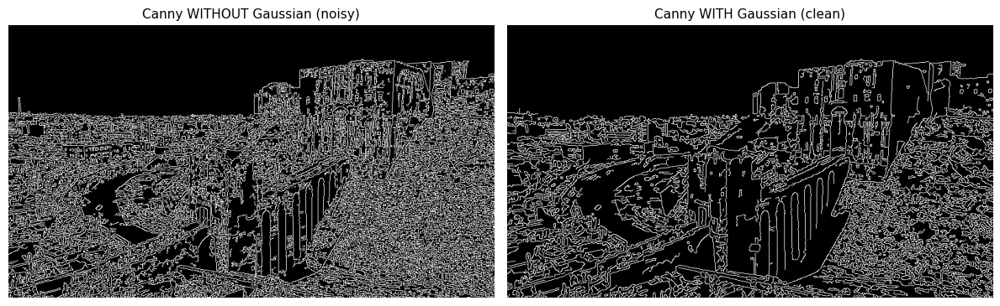

نسبة بكسلات الحواف بدون تمهيد: 22.93 %
نسبة بكسلات الحواف مع تمهيد:   14.34 %


In [14]:
edges_no_blur = cv2.Canny(img_gray, 50, 150)

smoothed = cv2.GaussianBlur(img_gray, (5, 5), 0)
edges_with_blur = cv2.Canny(smoothed, 50, 150)

show_images(
    [edges_no_blur, edges_with_blur],
    ["Canny WITHOUT Gaussian (noisy)", "Canny WITH Gaussian (clean)"],
    cmaps=["gray", "gray"], figsize=(12, 6),
)
print("نسبة بكسلات الحواف بدون تمهيد:", round(float(np.mean(edges_no_blur > 0)) * 100, 2), "%")
print("نسبة بكسلات الحواف مع تمهيد:  ", round(float(np.mean(edges_with_blur > 0)) * 100, 2), "%")


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>بدون تمهيد Gaussian، تظهر نتيجة Canny "مليئة بالحبيبات" وحواف كثيرة زائفة صغيرة (خصوصاً في مناطق الحجارة المتفصّلة
والسماء)، لأن كل تذبذب بسيط في شدة الإضاءة الناتج عن ضجيج الكاميرا يُترجَم فوراً إلى تدرّج (Gradient) في خطوة Sobel
— والخوارزمية لا تملك طريقة للتفريق بين "ضجيج عشوائي" و"حافة حقيقية" في هذه المرحلة. هذا يُبرهن عملياً لماذا كانت
<strong>المرحلة الأولى من مراحل Canny الخمس هي التمهيد بـ Gaussian</strong> بالضبط — ليست خطوة اختيارية بل جزء أساسي
من الخوارزمية نفسها.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 7 — مُحقّق المعاملات: عتبات Canny</h2>
<p><strong>⭐ أساسي — ضمن الجلسة</strong></p>
<p><strong>النوع:</strong> مُحقّق المعاملات (Parameter Detective) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 13 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> بناء حدس عملي حول تأثير <span dir="ltr" style="unicode-bidi: isolate;"><code>threshold1</code></span> و<span dir="ltr" style="unicode-bidi: isolate;"><code>threshold2</code></span> في <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Canny</code></span>، وربطه بـ"القاعدة الذهبية" (threshold2 ≈ 2-3× threshold1).</p>
<div dir="rtl" style="text-align: right;">


<h3>الخطوة 1 — رتّب قبل التنفيذ</h3>
<p>لديك ثلاثة أزواج عتبات لتطبيقها بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Canny(img_gray_or_smoothed, threshold1, threshold2)</code></span>:</p>
<ul>
<li>الزوج X: <span dir="ltr" style="unicode-bidi: isolate;"><code>(10, 30)</code></span></li>
<li>الزوج Y: <span dir="ltr" style="unicode-bidi: isolate;"><code>(50, 150)</code></span></li>
<li>الزوج Z: <span dir="ltr" style="unicode-bidi: isolate;"><code>(120, 260)</code></span></li>
</ul>
<p><strong>قبل تشغيل أي كود:</strong> رتّب الأزواج الثلاثة من "الأكثر حساسية / أكثر حواف وضجيج" إلى
"الأكثر تشدّداً / أقل حواف". اكتب ترتيبك وسبب اختيارك في تعليق.</p>
<h3>الخطوة 2 — نفّذ وتحقّق</h3>
<p>طبّق Canny بالثلاثة أزواج (بعد تمهيد Gaussian مناسب) واعرض النتائج الثلاث لتتحقّق من ترتيبك.</p>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>threshold1</code></span> (Low) هو الحدّ الذي دونه تُرمى البكسلات كلياً. <span dir="ltr" style="unicode-bidi: isolate;"><code>threshold2</code></span> (High) هو حدّ التأكيد كحافة قوية. كلما كانت القيمتان صغيرتين، قَبِلَت الخوارزمية بكسلات أضعف كحواف.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

راجع "القاعدة الذهبية" بالأسبوع 3: threshold2 يُفضَّل أن يكون تقريباً ضعف إلى ثلاثة أضعاف threshold1. أي الأزواج الثلاثة يخالف هذه القاعدة بوضوح؟

</details>

</div>

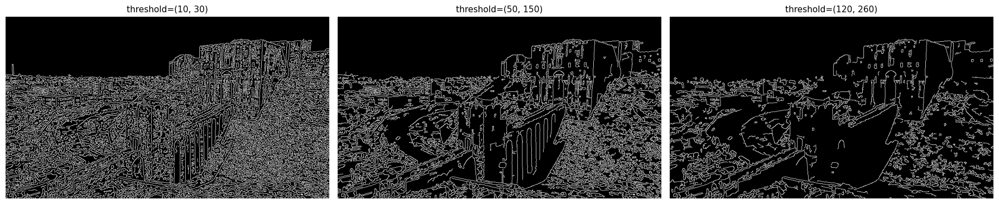

(10, 30): نسبة بكسلات الحواف = 21.22%
(50, 150): نسبة بكسلات الحواف = 14.34%
(120, 260): نسبة بكسلات الحواف = 8.19%


In [15]:
pairs = [(10, 30), (50, 150), (120, 260)]
smoothed_for_canny = cv2.GaussianBlur(img_gray, (5, 5), 0)

results = [cv2.Canny(smoothed_for_canny, lo, hi) for lo, hi in pairs]

show_images(
    results,
    [f"threshold={p}" for p in pairs],
    cmaps=["gray"] * 3, figsize=(18, 5),
)
for p, r in zip(pairs, results):
    print(f"{p}: نسبة بكسلات الحواف = {float(np.mean(r > 0)) * 100:.2f}%")


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>الزوج X (10, 30) هو الأكثر حساسية: عتبات منخفضة تعني قبول تدرّجات ضعيفة كحواف، فتظهر تفاصيل كثيرة جداً وضجيج.
الزوج Y (50, 150) هو الأكثر توازناً (وهو نفس الاختيار في دفتر الأسبوع 3، ويتبع القاعدة الذهبية 150=3×50 تماماً).
الزوج Z (120, 260) هو الأكثر تشدّداً (يقارب أيضاً 260≈2.2×120، فهو متّبع للقاعدة لكنه يبدأ من عتبة أعلى فيفقد الحواف
الضعيفة والمتوسطة تماماً، فتظهر فقط الحواف القوية جداً وتقل الكثافة الكلية بشكل واضح).</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #6C757D; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 8 — أصلح خط الأنابيب: تحديد صورة معطوبة</h2>
<p><strong>📘 في النسخة الكاملة فقط — غير مطلوب خلال الجلسة الحيّة</strong></p>
<p><strong>النوع:</strong> أصلح خط الأنابيب (Fix the Pipeline) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ممارسة تتبّع خط أنابيب متعدد المراحل عبر فحص القيم الوسيطة (Intermediate Values) لتحديد أين حدث الخلل تحديداً — لا مجرد "شيء ما خاطئ".</p>
<div dir="rtl" style="text-align: right;">


<h3>السيناريو</h3>
<p>الكود التالي (الخلية أدناه) يهدف إلى "زيادة حدّة" (Sharpen) صورة القلعة عبر طرح خريطة Laplacian من الصورة الأصلية
(تقنية كلاسيكية: <span dir="ltr" style="unicode-bidi: isolate;"><code>sharpened = original - laplacian</code></span>). الكود <strong>يعمل بلا أي خطأ برمجي</strong>، لكن النتيجة
تبدو مليئة ببقع بيضاء/سوداء غريبة بدل صورة أوضح.</p>
<h3>المهمة</h3>
<ol>
<li>شغّل الخلية أدناه وتأمّل النتيجة.</li>
<li>اطبع القيم الدنيا/العليا (min/max) للمتغيّر <span dir="ltr" style="unicode-bidi: isolate;"><code>lap</code></span> الخام، وقارنها بالقيم الدنيا/العليا بعد تحويله بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>.astype(np.uint8)</code></span>.</li>
<li>حدّد بدقة: في أي سطر بالضبط يحدث الخلل، وماذا يحدث رقمياً؟</li>
<li>أعد كتابة الحل بطريقة صحيحة (بدون التفاف/Overflow) في خلية حلّك.</li>
</ol>


</div>
</div>

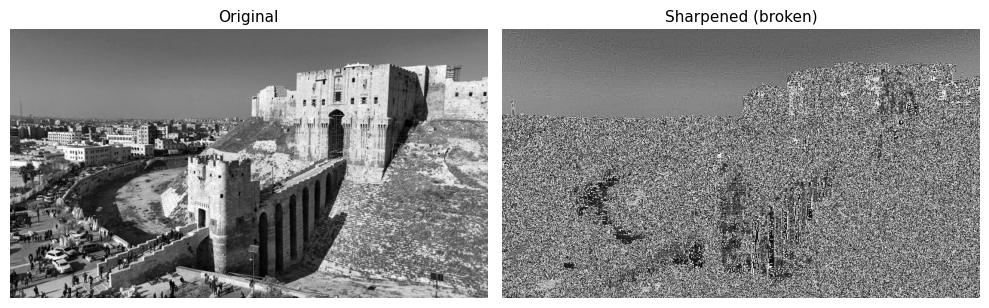

In [16]:
# --- الكود المُعطى (معطوب، شغّل هذه الخلية أولاً وتأمّل) ---
lap = cv2.Laplacian(img_gray, cv2.CV_64F, ksize=3)
broken_sharpened = img_gray - lap.astype(np.uint8)   # 🐞 يحتوي خللاً
show_images([img_gray, broken_sharpened], ["Original", "Sharpened (broken)"], cmaps=["gray", "gray"])


<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

ابدأ بفحص القيم الوسيطة كما اقتُرح: <span dir="ltr" style="unicode-bidi: isolate;"><code>print(lap.min(), lap.max())</code></span> ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>print(lap.astype(np.uint8).min(), lap.astype(np.uint8).max())</code></span>. النتيجتان لن تتطابقا منطقياً!

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

هذا نفس نوع مشكلة "الالتفاف" (Overflow) التي رأيتها في تمرين ضبط السطوع بالأسبوع الأول — لكن هنا في سياق Laplacian.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

الحل يتطلّب إجراء الطرح بنوع بيانات يتحمّل القيم السالبة أثناء العملية (مثل <span dir="ltr" style="unicode-bidi: isolate;"><code>int16</code></span> أو العمل مباشرة بقيم <span dir="ltr" style="unicode-bidi: isolate;"><code>lap</code></span> العشرية دون تحويلها لـ uint8 أولاً)، ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>np.clip</code></span> إلى [0, 255] قبل التحويل النهائي لـ uint8.

</details>

</div>

lap (float64)         min/max: -1528.0 / 1626.0
lap.astype(uint8)     min/max: 0 / 254


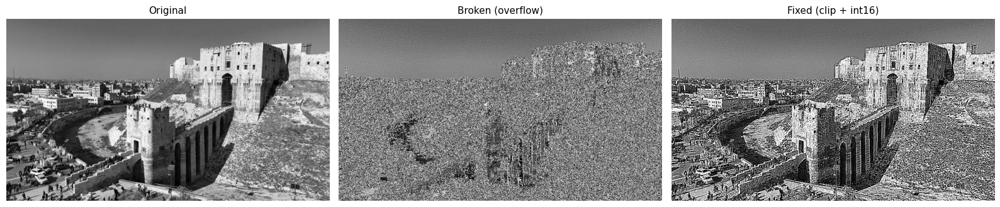

In [17]:
print("lap (float64)         min/max:", lap.min(), "/", lap.max())
print("lap.astype(uint8)     min/max:", lap.astype(np.uint8).min(), "/", lap.astype(np.uint8).max())
# القيم السالبة في lap (مثل -180) تلتفّ عند التحويل المباشر إلى uint8 (تصبح 76 مثلاً) بدل أن تُقصّ إلى 0

fixed_sharpened = np.clip(img_gray.astype(np.int16) - lap, 0, 255).astype(np.uint8)
show_images([img_gray, broken_sharpened, fixed_sharpened],
            ["Original", "Broken (overflow)", "Fixed (clip + int16)"],
            cmaps=["gray"] * 3, figsize=(16, 5))


<div dir="rtl" style="text-align: right;">


<h4>مكان الخلل بالضبط</h4>
<p>السطر <span dir="ltr" style="unicode-bidi: isolate;"><code>lap.astype(np.uint8)</code></span> هو مصدر المشكلة. <span dir="ltr" style="unicode-bidi: isolate;"><code>lap</code></span> نوعه <span dir="ltr" style="unicode-bidi: isolate;"><code>float64</code></span> ويحتوي قيماً سالبة (مثل -180).
حين تُحوَّل مباشرة إلى <span dir="ltr" style="unicode-bidi: isolate;"><code>uint8</code></span>، لا تُقصّ القيم السالبة إلى صفر كما قد نتوقّع، بل "تلتفّ" حسابياً حول الصفر
(مثل عدّاد ميكانيكي يرجع للخلف) فتتحوّل -180 إلى قيمة موجبة كبيرة خاطئة تماماً (76 تقريباً). هذا يجعل عملية الطرح
اللاحقة <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray - lap.astype(uint8)</code></span> تُنتج نتائج عشوائية المظهر في أماكن الحواف الحادة.</p>
<h4>الحل الصحيح</h4>
<p>نحوّل <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span> إلى <span dir="ltr" style="unicode-bidi: isolate;"><code>int16</code></span> (يتحمّل قيماً سالبة أثناء الحساب فقط)، نطرح <span dir="ltr" style="unicode-bidi: isolate;"><code>lap</code></span> مباشرة (بدون تحويله لـ uint8 مسبقاً)،
ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>np.clip(..., 0, 255)</code></span> يقصّ النتيجة النهائية بأمان لمجال [0, 255]، وأخيراً <span dir="ltr" style="unicode-bidi: isolate;"><code>.astype(np.uint8)</code></span> للعرض.
هذا تسلسل مطابق تماماً لتقنية "ضبط السطوع مع Clipping" من الأسبوع الأول: <span dir="ltr" style="unicode-bidi: isolate;"><code>astype(int16) → عملية حسابية → clip → astype(uint8)</code></span>.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #6C757D; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 9 — الهندسة العكسية: حواف نظيفة لأفق مدينة حلب</h2>
<p><strong>📘 في النسخة الكاملة فقط — غير مطلوب خلال الجلسة الحيّة</strong></p>
<p><strong>النوع:</strong> الهندسة العكسية (Reverse Engineering) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> بناء خط أنابيب Canny كامل بشكل مستقل تماماً (بدون تحديد أي دالة أو ترتيب مسبقاً)، على صورة "أصعب" من الصورة الرئيسية.</p>
<div dir="rtl" style="text-align: right;">


<h3>السيناريو</h3>
<p>صورة <strong>أفق مدينة حلب القديمة</strong> (<span dir="ltr" style="unicode-bidi: isolate;"><code>SKYLINE_PATH</code></span>) صعبة أكثر من صورة القلعة: فيها تدرّج ضوء غروب
(Golden Hour) بالسماء، وضباب/دخان خفيف يجعل التباين أقل وضوحاً في الخلفية.</p>
<h3>الهدف المطلوب (وصفياً، بدون خطوات محدَّدة)</h3>
<p>احصل على خريطة حواف <strong>نظيفة نسبياً</strong> تُبرز بوضوح خط الأفق والمباني والمئذنة، مع أقل قدر ممكن من
"الضجيج" الناتج عن تدرّج السماء الملوّنة. <strong>لن نُخبرك بترتيب الدوال أو قيم العتبات — قرّرها أنت</strong> بالاعتماد
على ما تعلّمته في التمارين السابقة.</p>
<h3>خطوات التقييم الذاتي</h3>
<ol>
<li>ابدأ بأي محاولة أولى، ثم افحص النتيجة بصرياً.</li>
<li>إن كانت السماء "مليئة بالحواف الزائفة"، ماذا يمكنك تعديله؟</li>
<li>إن كانت المباني والمئذنة غير واضحة كفاية، ماذا يمكنك تعديله بالاتجاه المعاكس؟</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

هذه مشكلة لها أكثر من حل صحيح واحد — الهدف هو أن "تتفاوض" مع المعاملات حتى تصل لنتيجة معقولة، لا أن تصل لقيمة سحرية واحدة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

فكّر في كل ما استخدمته في تمارين 6 و7: هل تحتاج تمهيداً أقوى من (5,5) بسبب التدرّج اللوني بالسماء؟ وهل تحتاج عتبات أعلى من المعتاد لتجاهل التدرّج الخفيف؟

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

مقياس تقريبي: إذا كانت أكثر من 20% من بكسلات الصورة "حواف"، فالنتيجة غالباً مشوَّشة بالضجيج وتحتاج عتبات أعلى أو تمهيداً أقوى.

</details>

</div>

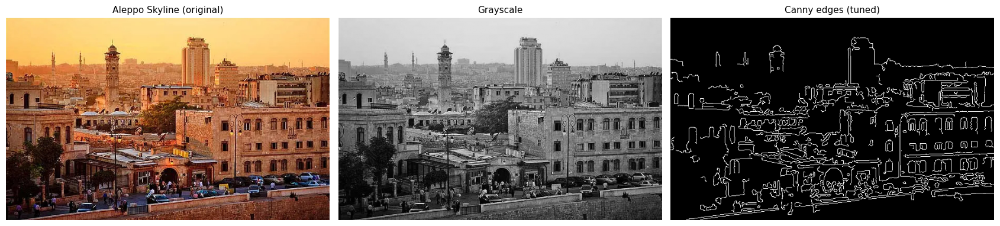

كثافة بكسلات الحواف: 7.06 %


In [18]:
skyline_bgr = cv2.imread(SKYLINE_PATH)
skyline_gray = cv2.cvtColor(skyline_bgr, cv2.COLOR_BGR2GRAY)

# تمهيد أقوى من المعتاد (7x7) بسبب تدرّج السماء الذي يولّد حواف زائفة كثيرة إن بقي حاداً
skyline_smoothed = cv2.GaussianBlur(skyline_gray, (7, 7), 0)

# عتبات أعلى قليلاً من المثال القياسي (50, 150) لتجاهل التدرّج الخفيف بالسماء
your_edges = cv2.Canny(skyline_smoothed, 70, 180)

show_images(
    [to_rgb(skyline_bgr), skyline_gray, your_edges],
    ["Aleppo Skyline (original)", "Grayscale", "Canny edges (tuned)"],
    cmaps=[None, "gray", "gray"], figsize=(17, 5),
)
print("كثافة بكسلات الحواف:", round(float(np.mean(your_edges > 0)) * 100, 2), "%")


<div dir="rtl" style="text-align: right;">


<h4>ملاحظة مهمة</h4>
<p>لا توجد قيم "صحيحة وحيدة" هنا — القيم أعلاه مثال معقول واحد فقط من عدة حلول صالحة. المهم في هذا التمرين هو
<strong>المنهجية</strong>: البدء بمحاولة، الفحص البصري، والتعديل الموجّه بناءً على السبب الجذري للمشكلة (تدرّج السماء)
لا التخمين العشوائي. إن وصل الطالب لنتيجة مختلفة بمنطق مشابه (تمهيد أقوى + عتبات أعلى، أو تمهيد عادي مع اقتصاص
جزء السماء من الصورة أولاً)، فهي إجابة مقبولة تماماً.</p>


</div>

<div dir="rtl" style="text-align: right;">


<h1>🏎️ الجزء الثالث — كشف الحركة (Motion Detection)</h1>
<p>الفيديو هو سلسلة إطارات. سنطبّق الآن الطريقتين الأكثر عملية من الأسبوع 3 لكشف الحركة بين الإطارات:
<strong>الفرق بين الإطارات (Frame Differencing)</strong> و<strong>طرح الخلفية (Background Subtraction / MOG2)</strong>،
على فيديو حقيقي لطريق مروري بكاميرا ثابتة.</p>


</div>

عدد الإطارات المقروءة: 56


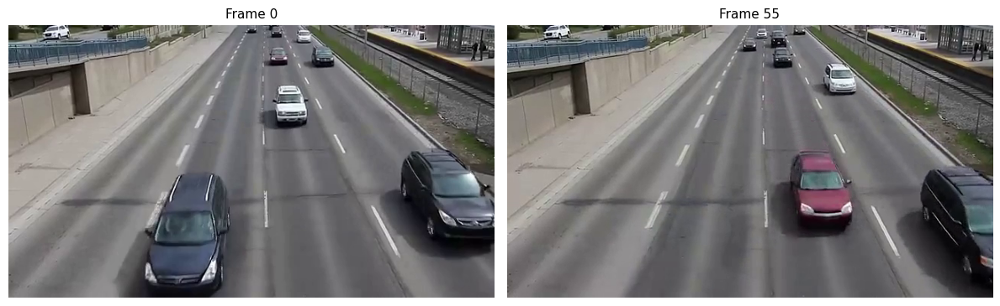

In [19]:
video_frames = read_video_frames(VIDEO_PATH, max_frames=56)
print(f"عدد الإطارات المقروءة: {len(video_frames)}")
show_images(
    [to_rgb(video_frames[0]), to_rgb(video_frames[-1])],
    [f"Frame 0", f"Frame {len(video_frames)-1}"],
    figsize=(12, 5),
)


<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 10 — تمرين موجَّه: Frame Differencing ونقطة ضعفه</h2>
<p><strong>⭐ أساسي — ضمن الجلسة &nbsp;|&nbsp; 🧭 تمرين موجَّه (أغلب الكود مُعطى — نشغّله ونناقشه معاً)</strong></p>
<p><strong>النوع:</strong> تمرين موجَّه + توقّع (Guided Practice + Predict) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟢 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ربط الصيغة الرياضية لـ Frame Differencing بنقطة ضعفها المذكورة نظرياً بالأسبوع 3 (اختفاء الجسم الساكن مؤقتاً) — عبر قراءة كود جاهز وتشغيله، لا كتابته من الصفر.</p>
<div dir="rtl" style="text-align: right;">


<h3>🧭 كيف يعمل هذا التمرين</h3>
<p>الكود الأساسي <strong>مكتوب لك بالكامل في الخلية أدناه</strong> — سنقرؤه ونشغّله معاً. مهمتك بعده
<strong>سطران أو ثلاثة فقط</strong> تستخدم فيها الدالة الجاهزة.</p>

<h3>الخطوة 1 — توقّع (قبل تشغيل أي شيء)</h3>
<p>بحسب الصيغة <span dir="ltr" style="unicode-bidi: isolate;"><code>D(t) = |I(t) - I(t-1)|</code></span>: لو توقّفت سيارة عن الحركة تماماً لعدة إطارات متتالية (كأن تنتظر إشارة
ضوئية)، ماذا سيظهر في خريطة الحركة الخاصة بها بعد اللحظة التي توقّفت فيها؟</p>

<h3>الخطوة 2 — اقرأ وشغّل الكود المُعطى</h3>
<p>الخلية أدناه تُعرّف الدالة <span dir="ltr" style="unicode-bidi: isolate;"><code>motion_signal(frames)</code></span> التي تُنفّذ Frame Differencing كاملاً
(تحويل لـ Grayscale ← <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.absdiff</code></span> ← <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.threshold</code></span> ← عدّ بكسلات الحركة)، ثم تعرض مثالاً بصرياً
وإشارة الحركة عبر الزمن للفيديو الأصلي. <strong>اقرأ الدالة سطراً سطراً</strong> — هي ترجمة مباشرة لصيغة الأسبوع 3.</p>

<h3>الخطوة 3 — مهمتك (قصيرة)</h3>
<p>سنُحاكي "سيارة متوقفة" بتكرار آخر إطار عدة مرات، ثم نُعيد استخدام <strong>نفس الدالة الجاهزة</strong> لنرى
ماذا يحدث للإشارة. لا تكتب الحلقة من جديد — فقط استدعِ <span dir="ltr" style="unicode-bidi: isolate;"><code>motion_signal</code></span>.</p>


</div>
</div>

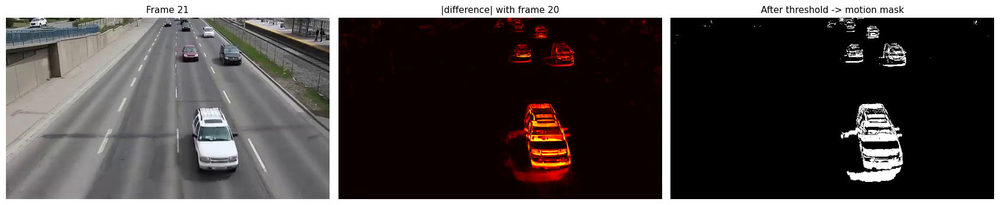

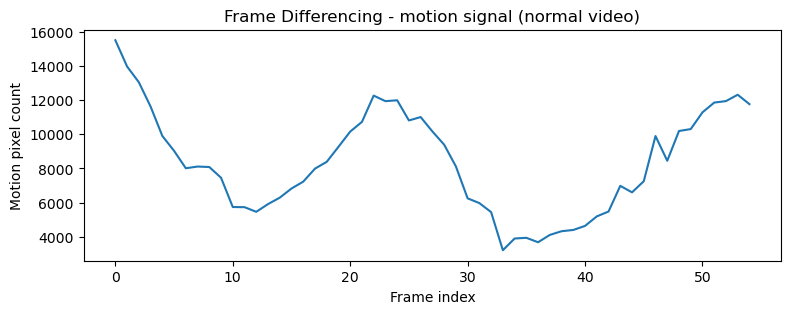

In [20]:
# ===== كود مُعطى — اقرأه وشغّله (لا تحتاج تعديله) =====

def motion_signal(frames, threshold=30):
    """Frame Differencing: لكل زوج إطارين متتاليين تحسب D = |I(t) - I(t-1)|،
    تُطبّق عتبة، ثم تُعيد عدد بكسلات الحركة. النتيجة: قائمة بطول len(frames) - 1."""
    signal = []
    prev_gray = cv2.cvtColor(frames[0], cv2.COLOR_BGR2GRAY)
    for frame in frames[1:]:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        diff = cv2.absdiff(prev_gray, gray)                        # D = |I(t) - I(t-1)|
        _, motion = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)
        signal.append(int(np.sum(motion == 255)))
        prev_gray = gray
    return signal


# (أ) مثال بصري: كيف تبدو خريطة الحركة بين إطارين متتاليين؟
gray_a = cv2.cvtColor(video_frames[20], cv2.COLOR_BGR2GRAY)
gray_b = cv2.cvtColor(video_frames[21], cv2.COLOR_BGR2GRAY)
demo_diff = cv2.absdiff(gray_a, gray_b)
_, demo_motion = cv2.threshold(demo_diff, 30, 255, cv2.THRESH_BINARY)

show_images(
    [to_rgb(video_frames[21]), demo_diff, demo_motion],
    ["Frame 21", "|difference| with frame 20", "After threshold -> motion mask"],
    cmaps=[None, "hot", "gray"], figsize=(17, 5),
)

# (ب) إشارة الحركة عبر الزمن للفيديو الأصلي (بلا تجميد)
normal_signal = motion_signal(video_frames)

plt.figure(figsize=(9, 3))
plt.plot(normal_signal)
plt.xlabel("Frame index")
plt.ylabel("Motion pixel count")
plt.title("Frame Differencing - motion signal (normal video)")
plt.show()


<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

لمحاكاة التجميد، أنت تحتاج قائمة إطارات جديدة = الأصلية + نسخ مكرّرة من آخر إطار. في Python، جمع قائمتين يتم بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>+</code></span>، وتكرار عنصر يتم بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>[x] * n</code></span>.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

الدالة جاهزة تماماً: <span dir="ltr" style="unicode-bidi: isolate;"><code>frozen_signal = motion_signal(frozen_frames)</code></span>. لا حاجة لأي حلقة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

لتوضيح لحظة بدء التجميد على الرسم البياني: <span dir="ltr" style="unicode-bidi: isolate;"><code>plt.axvline(x=len(video_frames) - 1, color='red', linestyle='--')</code></span>.

</details>

</div>

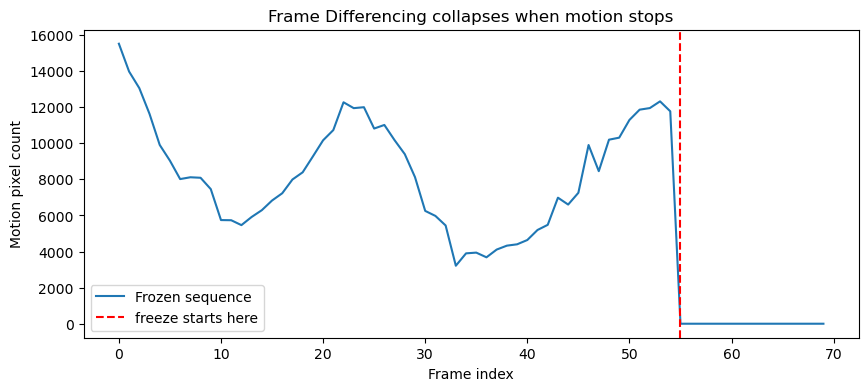

متوسط إشارة الحركة قبل التجميد: 8356.3 بكسل
متوسط إشارة الحركة بعد التجميد: 0.0 بكسل


In [21]:
frozen_frames = video_frames + [video_frames[-1]] * 15
frozen_signal = motion_signal(frozen_frames)

plt.figure(figsize=(10, 4))
plt.plot(frozen_signal, label="Frozen sequence")
plt.axvline(x=len(video_frames) - 1, color="red", linestyle="--", label="freeze starts here")
plt.xlabel("Frame index")
plt.ylabel("Motion pixel count")
plt.title("Frame Differencing collapses when motion stops")
plt.legend()
plt.show()

before = np.mean(frozen_signal[:len(video_frames) - 1])
after = np.mean(frozen_signal[len(video_frames) - 1:])
print(f"متوسط إشارة الحركة قبل التجميد: {before:.1f} بكسل")
print(f"متوسط إشارة الحركة بعد التجميد: {after:.1f} بكسل")


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>الخط البياني ينهار إلى الصفر تماماً بمجرد بدء "التجميد" — تماماً كما توقّعنا نظرياً. هذا يُثبت عملياً نقطة الضعف
التي ذكرها دفتر الأسبوع 3: بما أن Frame Differencing يعتمد فقط على المقارنة مع الإطار السابق مباشرة، فإن أي جسم
"يتجمّد" يصبح فوراً جزءاً من "الثابت" في نظر الخوارزمية ويختفي من خريطة الحركة، حتى لو كان لا يزال ظاهراً
تماماً في الصورة أمام الكاميرا.</p>
<p>لاحظ أيضاً في المثال البصري (أ) أن خريطة الحركة تُظهر <strong>أثر الإزاحة</strong> لا موضع السيارة الحالي بدقة —
وهي ملاحظة نُعمّقها في تمرين 11 بالنسخة الكاملة.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #6C757D; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 11 — تحليل الفشل: أثر سرعة الحركة على Frame Differencing</h2>
<p><strong>📘 في النسخة الكاملة فقط — غير مطلوب خلال الجلسة الحيّة</strong></p>
<p><strong>النوع:</strong> تحليل الفشل (Failure Analysis) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 8 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> ملاحظة أن Frame Differencing قد يُنتج نتائج "مزدوجة/شبحية" (Ghosting) حين تكون الحركة سريعة نسبياً للفترة الزمنية بين المقارنتين، لا فقط أن يفشل كلياً كما بتمرين 10.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>احسب <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.absdiff</code></span> بين إطارين <strong>متتاليين مباشرة</strong> (الإطار 0 والإطار 1).</li>
<li>احسب أيضاً <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.absdiff</code></span> بين إطارين <strong>بينهما فارق زمني أكبر</strong> (الإطار 0 والإطار 10).</li>
<li>اعرض الفرقين جنباً إلى جنب (استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cmap="hot"</code></span> لتوضيح الفرق بصرياً بشكل أفضل).</li>
<li>صف الفرق الواضح بين الحالتين — أين تظهر مشكلة "الشبحية/الازدواج" (Ghosting) بوضوح أكبر؟ لماذا تحدث؟</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

السيارات في هذا الفيديو تتحرّك بسرعة معقولة بين الإطارات. كلما زاد الفارق الزمني بين إطارَي المقارنة، زادت المسافة التي تحرّكت خلالها كل سيارة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

فكّر: هل تُنتج المقارنة بين موضعَين مختلفين تماماً لنفس السيارة "بقعة واحدة متّصلة"، أم "بقعتين منفصلتين" (الموضع القديم + الموضع الجديد)؟

</details>

</div>

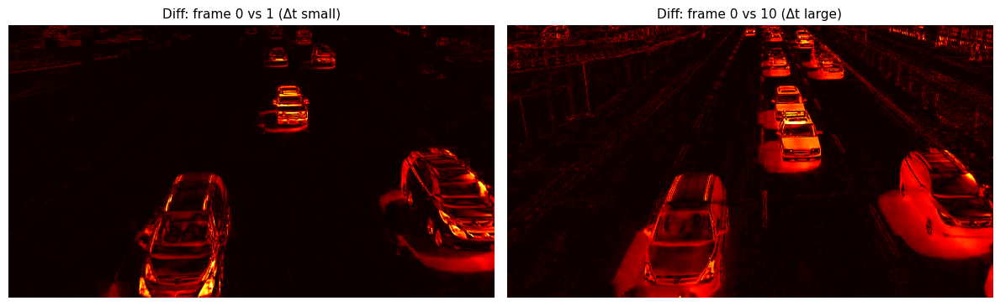

In [22]:
gray0 = cv2.cvtColor(video_frames[0], cv2.COLOR_BGR2GRAY)
gray1 = cv2.cvtColor(video_frames[1], cv2.COLOR_BGR2GRAY)
gray10 = cv2.cvtColor(video_frames[10], cv2.COLOR_BGR2GRAY)

diff_close = cv2.absdiff(gray0, gray1)
diff_far = cv2.absdiff(gray0, gray10)

show_images(
    [diff_close, diff_far],
    ["Diff: frame 0 vs 1 (Δt small)", "Diff: frame 0 vs 10 (Δt large)"],
    cmaps=["hot", "hot"], figsize=(12, 5),
)


<div dir="rtl" style="text-align:right;"><h4>الشرح</h4>
<p>في مقارنة الإطارين المتتاليين (0 و1)، تكون الإزاحة صغيرة فتظهر كل سيارة كبقعة واحدة متماسكة تقريباً في منطقة
التداخل بين موضعيها القديم والجديد. في مقارنة (0 و10) حيث الفارق الزمني أكبر، تكون كل سيارة قد تحرّكت مسافة
أكبر بكثير، فيظهر الفرق كخطّين/بقعتين منفصلتين تقريباً — <strong>مكان السيارة القديم ومكانها الجديد</strong> —
دون أن يمثّل ذلك موضعها الفعلي الحالي بدقة. هذه هي مشكلة "الشبحية" (Ghosting): Frame Differencing لا يُعطي
موضعاً واحداً دقيقاً للجسم المتحرك، بل بصمة إزاحته، وتتضاعف هذه المشكلة مع سرعة الحركة والفارق الزمني بين
إطاري المقارنة.</p></div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 12 — تمرين موجَّه: طرح الخلفية بـ MOG2 وأثر حساسيته</h2>
<p><strong>⭐ أساسي — ضمن الجلسة &nbsp;|&nbsp; 🧭 تمرين موجَّه (أغلب الكود مُعطى — نشغّله ونناقشه معاً)</strong></p>
<p><strong>النوع:</strong> تمرين موجَّه + مُحقّق المعاملات (Guided Practice + Parameter Detective) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 15 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> فهم كيف يبني <span dir="ltr" style="unicode-bidi: isolate;"><code>MOG2</code></span> نموذج خلفية متطوّراً عبر الزمن، وكيف يتحكّم <span dir="ltr" style="unicode-bidi: isolate;"><code>varThreshold</code></span> في حساسية الكشف — عبر تشغيل كود جاهز وتغيير معامل واحد.</p>
<div dir="rtl" style="text-align: right;">


<h3>🧭 كيف يعمل هذا التمرين</h3>
<p>خط أنابيب <span dir="ltr" style="unicode-bidi: isolate;"><code>MOG2</code></span> كامل <strong>مكتوب لك في الخلية أدناه</strong> كدالة جاهزة. سنشغّله معاً ونتأمّل ثلاثة أشياء:
الخلفية التي "تعلّمتها" الخوارزمية، قناع الحركة الناتج، وإشارة الحركة عبر الزمن.</p>

<h3>الخطوة 1 — اقرأ وشغّل الكود المُعطى</h3>
<p>ركّز تحديداً على لوحة <strong>"الخلفية المتعلَّمة"</strong>: الخوارزمية لم تُعطَ صورة طريق فارغ أبداً — بل استنتجتها
وحدها من تكرار البكسلات الثابتة عبر الإطارات. لاحظ أيضاً شكل إشارة الحركة في <strong>الإطارات الأولى</strong>.</p>

<h3>الخطوة 2 — مهمتك: مُحقّق المعاملات (سطران)</h3>
<p>المعامل <span dir="ltr" style="unicode-bidi: isolate;"><code>varThreshold</code></span> يتحكّم في <strong>حساسية</strong> الكشف: كلما صغُر، اعتبرت الخوارزمية فروقاً أضعف "حركة".</p>
<p><strong>قبل التشغيل، توقّع:</strong> إذا رفعنا <span dir="ltr" style="unicode-bidi: isolate;"><code>varThreshold</code></span> من 16 إلى قيمة أكبر بكثير (مثلاً 80)،
هل سيزيد عدد بكسلات الحركة أم ينقص؟ ولماذا؟</p>
<p>ثم استخدم الدالة الجاهزة <span dir="ltr" style="unicode-bidi: isolate;"><code>run_mog2</code></span> بقيمة <span dir="ltr" style="unicode-bidi: isolate;"><code>var_threshold=80</code></span>، وارسم النتيجتين معاً في رسم بياني
واحد للمقارنة.</p>


</div>
</div>

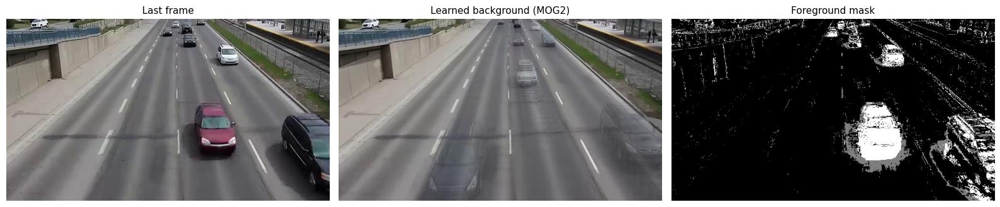

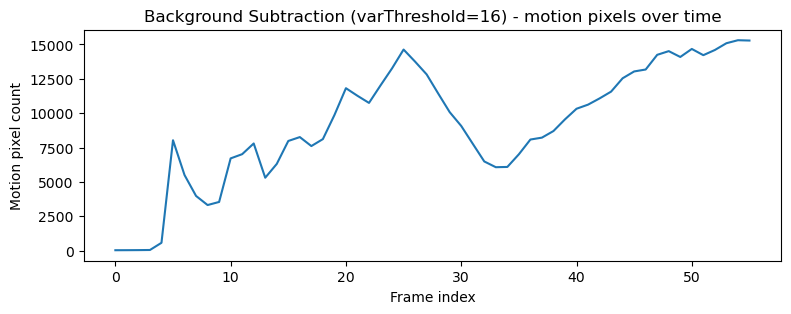

In [23]:
# ===== كود مُعطى — اقرأه وشغّله (لا تحتاج تعديله) =====

def run_mog2(frames, history=100, var_threshold=16):
    """Background Subtraction بطريقة MOG2.
    تُعيد: (عدد بكسلات الحركة لكل إطار، صورة الخلفية المتعلَّمة، آخر قناع مقدمة)."""
    back_sub = cv2.createBackgroundSubtractorMOG2(
        history=history,            # عدد الإطارات المستخدمة لبناء نموذج الخلفية
        varThreshold=var_threshold, # حساسية الكشف: أصغر = أكثر حساسية
        detectShadows=True,         # الظل يأخذ القيمة 127 بدل 255
    )
    counts, last_mask = [], None
    for frame in frames:
        fg_mask = back_sub.apply(frame)                 # 0=خلفية | 127=ظل | 255=حركة مؤكّدة
        counts.append(int(np.sum(fg_mask == 255)))
        last_mask = fg_mask
    return counts, back_sub.getBackgroundImage(), last_mask


# تشغيل بالإعدادات القياسية (نفس اختيار دفتر الأسبوع 3)
motion_pixel_counts, bg_image, last_mask = run_mog2(video_frames, history=100, var_threshold=16)

show_images(
    [to_rgb(video_frames[-1]), to_rgb(bg_image), last_mask],
    ["Last frame", "Learned background (MOG2)", "Foreground mask"],
    cmaps=[None, None, "gray"], figsize=(16, 5),
)

plt.figure(figsize=(9, 3))
plt.plot(motion_pixel_counts)
plt.xlabel("Frame index")
plt.ylabel("Motion pixel count")
plt.title("Background Subtraction (varThreshold=16) - motion pixels over time")
plt.show()


<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

الدالة جاهزة بالكامل — كل ما تحتاجه هو استدعاؤها بقيمة مختلفة: <span dir="ltr" style="unicode-bidi: isolate;"><code>counts_b, bg_b, mask_b = run_mog2(video_frames, var_threshold=80)</code></span>.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

لرسم خطّين في نفس الشكل: استدعِ <span dir="ltr" style="unicode-bidi: isolate;"><code>plt.plot</code></span> مرتين قبل <span dir="ltr" style="unicode-bidi: isolate;"><code>plt.show()</code></span>، مع تمرير <span dir="ltr" style="unicode-bidi: isolate;"><code>label=...</code></span> لكل خط ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>plt.legend()</code></span>.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

فكّر في معنى "العتبة" عموماً: رفع أي عتبة يجعل الشرط أصعب على التحقّق — فهل يزيد ذلك عدد البكسلات المقبولة كحركة أم يُقلّلها؟

</details>

</div>

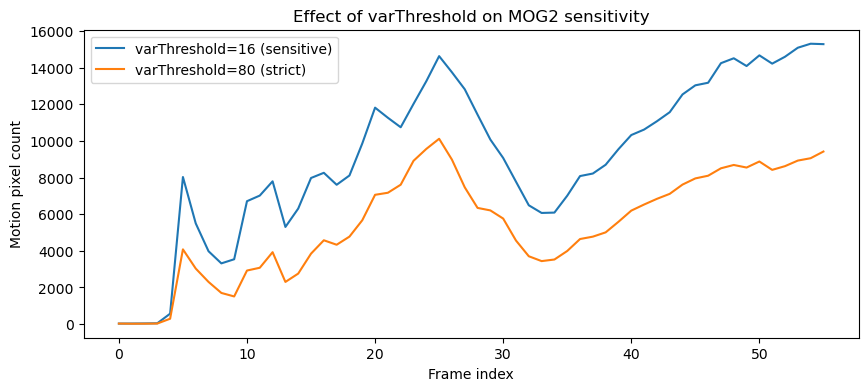

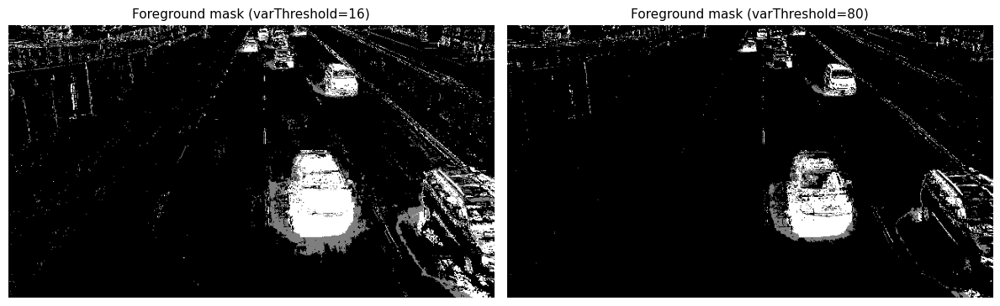

متوسط بكسلات الحركة عند varThreshold=16: 9162.8
متوسط بكسلات الحركة عند varThreshold=80: 5445.7


In [24]:
counts_strict, bg_strict, mask_strict = run_mog2(video_frames, history=100, var_threshold=80)

plt.figure(figsize=(10, 4))
plt.plot(motion_pixel_counts, label="varThreshold=16 (sensitive)")
plt.plot(counts_strict, label="varThreshold=80 (strict)")
plt.xlabel("Frame index")
plt.ylabel("Motion pixel count")
plt.title("Effect of varThreshold on MOG2 sensitivity")
plt.legend()
plt.show()

show_images(
    [last_mask, mask_strict],
    ["Foreground mask (varThreshold=16)", "Foreground mask (varThreshold=80)"],
    cmaps=["gray", "gray"], figsize=(12, 5),
)

print("متوسط بكسلات الحركة عند varThreshold=16:", round(float(np.mean(motion_pixel_counts)), 1))
print("متوسط بكسلات الحركة عند varThreshold=80:", round(float(np.mean(counts_strict)), 1))


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p><strong>أثر varThreshold:</strong> رفع العتبة يجعل الخوارزمية <strong>أكثر تشدّداً</strong> — تحتاج فرقاً أكبر عن نموذج
الخلفية قبل أن تصنّف البكسل كحركة، فينخفض عدد بكسلات الحركة بوضوح. النتيجة: ضجيج أقل، لكن خطر فقدان الأجسام
الصغيرة أو ضعيفة التباين مع الطريق. هذه نفس المفاضلة التي رأيناها مع عتبات Canny في تمرين 7 — عتبة أعلى = نتيجة
أنظف لكن أقل اكتشافاً.</p>
<h4>زمن التعلّم (Warm-up)</h4>
<p>لاحظ أن إشارة الحركة تبدأ قرب الصفر ثم ترتفع في الإطارات الأولى: نموذج الخلفية لم يتشكّل بعد، فلا تملك الخوارزمية
مرجعاً تقارن به. هذا "زمن التعلّم" فرق جوهري عن Frame Differencing (تمرين 10) الذي يعمل من الإطار الثاني مباشرة
بلا أي تمهيد — لكنه بالمقابل ينهار حين تتوقّف الحركة، وهو ما لا يحدث هنا.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #6C757D; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 13 — قارن واختر: Frame Differencing مقابل Background Subtraction</h2>
<p><strong>📘 في النسخة الكاملة فقط — غير مطلوب خلال الجلسة الحيّة</strong></p>
<p><strong>النوع:</strong> مقارنة واتخاذ قرار (Compare & Decide) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 10 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 أساسي</p>
<p><strong>🎯 الهدف التعليمي:</strong> بناء حكم مهني (Engineering Judgment) حول أي طريقة كشف حركة أنسب لسياق معيّن، بالاعتماد على أدلّة رقمية وبصرية أنتجتها بنفسك في التمارين السابقة، لا على جدول جاهز.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>ارسم في رسم بياني واحد: عدد بكسلات الحركة عبر الزمن من <span dir="ltr" style="unicode-bidi: isolate;"><code>Frame Differencing</code></span> (أعد حسابها بعتبة مناسبة على كل الإطارات)
وعدد بكسلات الحركة من <span dir="ltr" style="unicode-bidi: isolate;"><code>motion_pixel_counts</code></span> (تمرين 12) معاً، للمقارنة المباشرة.</li>
<li>أجب كتابياً على الأسئلة التالية:</li>
</ol>
<ul>
<li>بالاستناد لتمرين 10 و11: أي طريقة تتعامل بشكل أفضل مع سيارة قد تتوقف مؤقتاً عند إشارة ضوئية؟</li>
<li>أي طريقة تحتاج "وقت تعلّم" (Warm-up) قبل أن تعمل بدقة كاملة؟</li>
<li>لو كانت الكاميرا ثابتة تماماً على طريق سريع لمراقبة مرورية طويلة الأمد (أيام)، أي طريقة تختار؟ برّر إجابتك.</li>
</ul>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

لحساب متسلسلة Frame Differencing على كل الإطارات: كرّر منطق تمرين 10 لكن بدون التجميد، وطبّق عتبة (Threshold) على <span dir="ltr" style="unicode-bidi: isolate;"><code>diff</code></span> قبل عدّ البكسلات، بنفس فكرة الأسبوع 3.

</details>

</div>

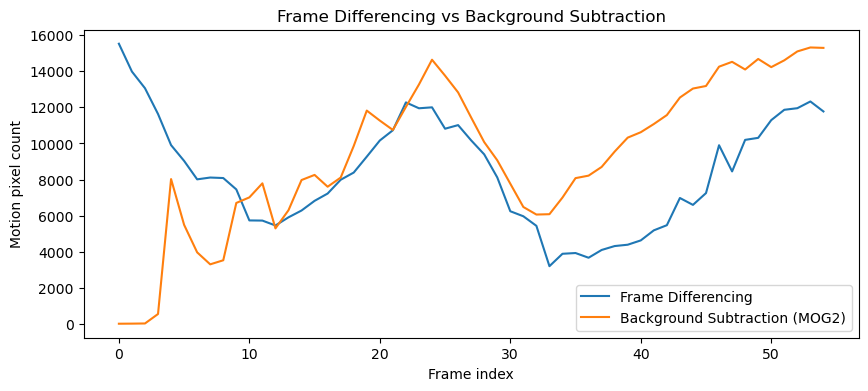

In [25]:
frame_diff_counts = []
prev_gray = cv2.cvtColor(video_frames[0], cv2.COLOR_BGR2GRAY)
for frame in video_frames[1:]:
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    diff = cv2.absdiff(prev_gray, gray)
    _, motion = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
    frame_diff_counts.append(int(np.sum(motion == 255)))
    prev_gray = gray

plt.figure(figsize=(10, 4))
plt.plot(frame_diff_counts, label="Frame Differencing")
plt.plot(motion_pixel_counts[1:], label="Background Subtraction (MOG2)")
plt.xlabel("Frame index")
plt.ylabel("Motion pixel count")
plt.title("Frame Differencing vs Background Subtraction")
plt.legend()
plt.show()


<div dir="rtl" style="text-align: right;">


<h4>إجابات مقترحة للنقاش</h4>
<ul>
<li><strong>سيارة متوقفة مؤقتاً:</strong> Background Subtraction أفضل — الخلفية المتعلَّمة لا تمتصّ السيارة فوراً
(معدّل التعلّم α صغير)، فتبقى مكتشَفة كحركة/جسم غريب لفترة أطول من Frame Differencing الذي يفقدها بمجرد توقّفها.</li>
<li><strong>وقت التعلّم:</strong> Background Subtraction يحتاج عدة إطارات في البداية لتتشكّل خلفية مستقرة (لاحظ الارتفاع
في بداية الرسم البياني بتمرين 12)، أما Frame Differencing يعمل من الإطار الثاني مباشرة بلا أي تمهيد.</li>
<li><strong>مراقبة طويلة الأمد:</strong> Background Subtraction أفضل بوضوح — يتحمّل تغيّرات الإضاءة التدريجية (شروق/غروب،
ظل الغيوم) لأنه يُحدِّث الخلفية باستمرار، بخلاف Frame Differencing الذي حسّاس جداً لأي تغيّر إضاءة مفاجئ بين إطارين
(حتى لو لم توجد حركة حقيقية).</li>
</ul>


</div>

<div dir="rtl" style="text-align: right;">


<h1>🏆 التحدي النهائي المتكامل</h1>
<p>وصلنا للحظة التي تجمع فيها الأسبوع 3 كله معاً — تماماً كما وصف دفتر الأسبوع 3 في "الصورة الكبرى":
<strong>تصفية ← كشف حركة ← كشف حواف</strong>.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #2E86AB; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 14 — كاميرا مراقبة ذكية: تحديد هيكل المركبات المتحرّكة فقط</h2>
<p><strong>⭐ أساسي — ضمن الجلسة &nbsp;|&nbsp; 🧭 تمرين موجَّه (أغلب الكود مُعطى — نشغّله ونناقشه معاً)</strong></p>
<p><strong>النوع:</strong> تحدٍ نهائي متكامل (Final Integrated Challenge) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 25 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 أساسي (تحدٍ ختامي)</p>
<p><strong>🎯 الهدف التعليمي:</strong> بناء خط أنابيب واحد يدمج الفلترة، كشف الحركة، وكشف الحواف — بشكل مستقل تماماً، لإنتاج نتيجة عملية ذات قيمة واضحة (تحديد شكل المركبات المتحرّكة فقط، بدل الصورة كاملة).</p>
<div dir="rtl" style="text-align: right;">


<h3>السيناريو</h3>
<p>تعمل على نظام كاميرا مراقبة مرورية ذكي وبسيط. المطلوب: صورة نهائية واحدة تُظهر <strong>حواف المركبات المتحرّكة
فقط</strong> — وليس حواف الطريق والحواجز والخلفية الثابتة بالكامل (وهذا فرق جوهري عن كل تمارين كشف الحواف السابقة،
حيث أردنا هناك <em>كل</em> حواف الصورة).</p>

<h3>🧭 كيف يعمل هذا التمرين</h3>
<p>الخطوات <strong>الميكانيكية</strong> التي تدرّبت عليها بالفعل (تشغيل MOG2 لبناء خلفية مستقرة، التحويل لـ Grayscale،
التصفية، وحساب Canny) <strong>مكتوبة لك في الخلية أدناه</strong>. لن نُضيّع وقت نهاية الجلسة في إعادة كتابتها.</p>
<p>مهمتك هي <strong>الخطوة المفاهيمية الأهم في الجلسة كلها</strong>: كيف تجعل الحواف تظهر
<strong>داخل مناطق الحركة فقط</strong>؟ ثلاثة أو أربعة أسطر — لكنها بيت القصيد.</p>

<h3>المطلوب منك</h3>
<ol>
<li>حوّل قناع المقدمة <span dir="ltr" style="unicode-bidi: isolate;"><code>fg_mask_final</code></span> إلى قناع Boolean (True عند الحركة المؤكّدة فقط).</li>
<li>استخدم هذا القناع لتقييد <span dir="ltr" style="unicode-bidi: isolate;"><code>full_edges</code></span> بحيث تبقى الحواف داخل مناطق الحركة وتُصفَّر خارجها —
بنفس منطق Boolean Masking الذي تعرفه من الأسبوعين السابقين.</li>
<li>ارسم النتيجة بلون واضح (مثلاً أحمر) فوق نسخة RGB من الإطار الأصلي.</li>
<li>اعرض اللوحات الأربع معاً للمقارنة.</li>
</ol>

<h3>سؤال للنقاش بعد التشغيل</h3>
<p>لماذا كان لا بد أن تأتي التصفية <strong>قبل</strong> كشف الحواف، وكشف الحركة <strong>قبل</strong> تقييد الحواف؟
ماذا كان سيحدث لو عكسنا الترتيب؟</p>


</div>
</div>

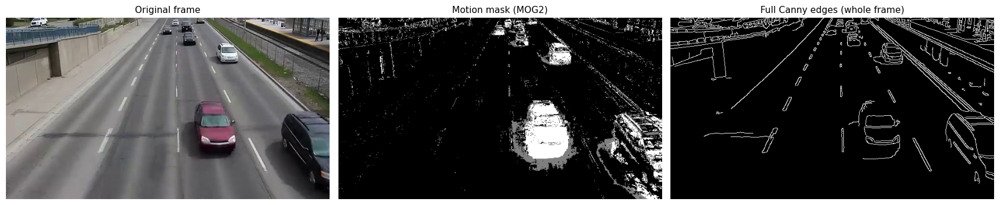

جاهز — الآن دورك: قيّد الحواف بمنطقة الحركة فقط.


In [26]:
# ===== كود مُعطى — الخطوات الميكانيكية التي تدرّبت عليها مسبقاً =====

# (1) نبني خلفية مستقرة من كل الإطارات السابقة (نفس فكرة تمرين 12)
back_sub_final = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=16, detectShadows=True)
for f in video_frames[:-1]:
    back_sub_final.apply(f)

last_frame = video_frames[-1]

# (2) تصفية: Grayscale ثم Gaussian لتقليل الضجيج قبل أي تحليل
gray_final = cv2.cvtColor(last_frame, cv2.COLOR_BGR2GRAY)
smoothed_final = cv2.GaussianBlur(gray_final, (5, 5), 0)

# (3) كشف الحركة على الإطار الأخير
fg_mask_final = back_sub_final.apply(last_frame)     # 0=خلفية | 127=ظل | 255=حركة مؤكّدة

# (4) كشف الحواف على الصورة المُصفّاة (كل حواف الإطار، بلا تقييد بعد)
full_edges = cv2.Canny(smoothed_final, 50, 150)

show_images(
    [to_rgb(last_frame), fg_mask_final, full_edges],
    ["Original frame", "Motion mask (MOG2)", "Full Canny edges (whole frame)"],
    cmaps=[None, "gray", "gray"], figsize=(17, 5),
)
print("جاهز — الآن دورك: قيّد الحواف بمنطقة الحركة فقط.")


<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

القناع <span dir="ltr" style="unicode-bidi: isolate;"><code>fg_mask_final</code></span> قيمه ثلاث: 0 (خلفية)، 127 (ظل)، 255 (حركة مؤكّدة). نريد True عند الحركة المؤكّدة فقط — أي مقارنة بسيطة تُنتج مصفوفة Boolean.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

لتقييد مصفوفة بقناع Boolean: <span dir="ltr" style="unicode-bidi: isolate;"><code>np.where(mask, edges, 0)</code></span> تُبقي قيمة <span dir="ltr" style="unicode-bidi: isolate;"><code>edges</code></span> حيث القناع True وتضع 0 حيث هو False. بديل مكافئ: <span dir="ltr" style="unicode-bidi: isolate;"><code>edges_copy[~mask] = 0</code></span>.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 3</strong></summary>

للتلوين فوق الصورة: <span dir="ltr" style="unicode-bidi: isolate;"><code>overlay = to_rgb(last_frame).copy()</code></span> ثم <span dir="ltr" style="unicode-bidi: isolate;"><code>overlay[edges_in_motion_only > 0] = [255, 0, 0]</code></span>.

</details>

</div>

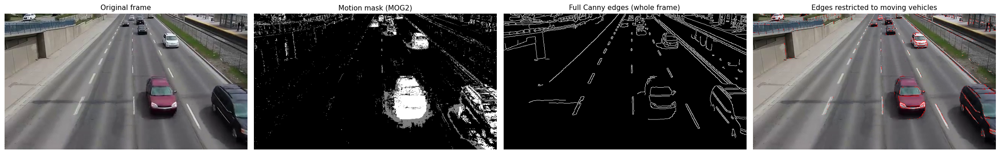

بكسلات الحواف قبل التقييد: 11254
بكسلات الحواف بعد التقييد بمنطقة الحركة: 2074


In [27]:
motion_mask_final = (fg_mask_final == 255)
edges_in_motion_only = np.where(motion_mask_final, full_edges, 0)

overlay = to_rgb(last_frame).copy()
overlay[edges_in_motion_only > 0] = [255, 0, 0]

show_images(
    [to_rgb(last_frame), fg_mask_final, full_edges, overlay],
    ["Original frame", "Motion mask (MOG2)", "Full Canny edges (whole frame)", "Edges restricted to moving vehicles"],
    cmaps=[None, "gray", "gray", None], figsize=(22, 5),
)

print("بكسلات الحواف قبل التقييد:", int(np.sum(full_edges > 0)))
print("بكسلات الحواف بعد التقييد بمنطقة الحركة:", int(np.sum(edges_in_motion_only > 0)))


<div dir="rtl" style="text-align: right;">


<h4>الشرح — لماذا هذا الترتيب بالذات؟</h4>
<p>هذا التحدي هو التطبيق العملي المباشر لخلاصة دفتر الأسبوع 3: <em>"بدون التصفية، سيفشل كشف الحركة بسبب الضجيج.
وبدون كشف الحركة، ستتشتّت خوارزمية كشف الحواف بتفاصيل الخلفية غير المهمة."</em> لاحظ في اللوحة الثالثة (كل الحواف)
كيف أن الطريق، الحواجز، والجسر تُنتج حواف كثيرة جداً لا تهمّنا؛ بينما اللوحة الرابعة (بعد التقييد بقناع الحركة)
تُظهر فقط حواف المركبات المتحرّكة — وهذا هو الفرق الجوهري بين "كشف كل الحواف" و"كشف الحواف المهمة فقط".</p>
<h4>لو عكسنا الترتيب؟</h4>
<ul>
<li><strong>كشف حواف قبل التصفية:</strong> ستمتلئ النتيجة بحواف زائفة من ضجيج الفيديو (رأينا هذا تماماً في تمرين 6).</li>
<li><strong>تقييد قبل كشف الحركة:</strong> مستحيل منطقياً — لا نملك بعدُ القناع الذي نُقيّد به.</li>
</ul>
<h4>ملاحظة حول الحلول البديلة</h4>
<p>استخدام Frame Differencing (تمرين 10) بدل MOG2 في خطوة كشف الحركة حلٌّ مقبول تماماً أيضاً، طالما تم تبرير
الاختيار (أسرع حساباً إن كانت الموارد محدودة، لكنه يفقد المركبة إن توقّفت). المهم هو المنطق الهندسي للقرار،
لا الدالة المحدَّدة.</p>
<p>كذلك {cs("motion_mask_final = (fg_mask_final >= 127)")} خيار مقبول إن أردنا اعتبار الظلال جزءاً من الجسم المتحرك —
وهو قرار تصميمي له ما يبرّره في بعض التطبيقات.</p>


</div>

<div dir="rtl" style="text-align: right;">


<h1>🧩 ختام الجلسة — تأمّل سريع</h1>
<p>لا حاجة لكتابة كود جديد هنا. فقط فكّر وناقش مع زملائك وبقية الصف الأسئلة التالية لمدة دقائق قليلة:</p>
<ol>
<li>أي فلتر أو خوارزمية من هذا الأسبوع غيّرت طريقة فهمك لمفهوم "الصورة كمصفوفة أرقام"؟</li>
<li>لو طُلب منك بناء نظام بسيط لعدّ المركبات على طريق في حلب باستخدام كاميرا ثابتة رخيصة، أي طريقة من طرق كشف
الحركة الثلاث تختار، وبأي فلتر تسبقها؟ برّر اختيارك.</li>
<li>ما أول شيء ستفحصه إذا أعطاك خط أنابيب حواف أو حركة نتيجة غير متوقّعة في مشروع مستقبلي؟</li>
</ol>


</div>

<div dir="rtl" style="text-align: right;">


<h2>📘 القسم التالي — تمارين خارج الجلسة الحيّة</h2>
<p>ما تبقّى من هذا الدفتر هو مادة <strong>غير مُدرَجة في دفتر الطالب</strong>: تمارين توسّعية أعمق أو أطول
من أن تتّسع لها الجلسة. كلها مبنية فقط على مفاهيم الأسبوع 3 ومهارات Python العامة التي يملكها الطالب.</p>
<p>ملاحظة: التمارين 8، 9، 11، 13 (السابقة في هذا الدفتر) هي أيضاً خارج دفتر الطالب، لكنها بقيت في مواضعها
الأصلية حفاظاً على تسلسل الترقيم.</p>


</div>

<div dir="rtl" style="text-align: right;">


<h1>🚀 تمارين إضافية للمراجعة العميقة (اختيارية)</h1>
<p>التمارين التالية أعمق أو أطول من تمارين الجلسة الأساسية. لا حاجة لحلّها كلها — اختر ما يهمّك أكثر.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #C97B2E; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 15 — فلتر Median من الصفر (بدون OpenCV)</h2>
<p><strong>🚀 إضافي — بعد الجلسة / للمنزل (النسخة الكاملة فقط)</strong></p>
<p><strong>النوع:</strong> بناء من الصفر (From Scratch) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 20 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 اختياري</p>
<p><strong>🎯 الهدف التعليمي:</strong> إعادة بناء التمرين الذي تركه دفتر الأسبوع 3 بلا حل — تطبيق فلتر Median يدوياً بـ NumPy، بنفس أسلوب الدوال اليدوية (Gaussian, Sobel) التي رأيتها بالأسبوع 3.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>اكتب دالة <span dir="ltr" style="unicode-bidi: isolate;"><code>apply_median_filter_from_scratch(image, kernel_size=3)</code></span> تُطبّق فلتر Median يدوياً:
لكل بكسل، اجمع قيم الجيران في نافذة <span dir="ltr" style="unicode-bidi: isolate;"><code>kernel_size × kernel_size</code></span>، رتّبها، واختر القيمة الوسطى.</li>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>np.pad(image, pad, mode='reflect')</code></span> تماماً كما فعل دفتر الأسبوع 3 مع Gaussian وSobel.</li>
<li>طبّقها على صورة صغيرة مشوَّشة بـ Salt-and-Pepper (لتفادي بطء الحلقات المتداخلة)، وقارن بـ <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.medianBlur</code></span>.</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

استخدم نفس هيكل <span dir="ltr" style="unicode-bidi: isolate;"><code>apply_gaussian_blur_from_scratch</code></span> من الأسبوع 3 (حلقتان for متداخلتان + padding)، لكن بدل الضرب بنواة والجمع، استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>np.sort</code></span> أو <span dir="ltr" style="unicode-bidi: isolate;"><code>np.median</code></span> على المنطقة المستخرجة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>np.median(region)</code></span> تُعطيك مباشرة القيمة الوسطى دون الحاجة لفرزها يدوياً بنفسك.

</details>

</div>

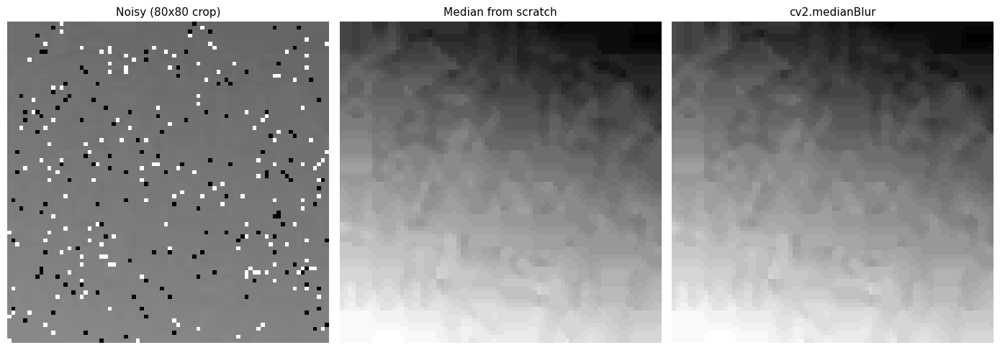

أقصى فرق بين النسختين: 3


In [28]:
def apply_median_filter_from_scratch(image, kernel_size=3):
    pad = kernel_size // 2
    padded = np.pad(image, pad, mode="reflect")
    output = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i + kernel_size, j:j + kernel_size]
            output[i, j] = np.median(region)
    return output


small_noisy = add_salt_and_pepper_noise(img_gray[:80, :80], amount=0.05)
median_scratch = apply_median_filter_from_scratch(small_noisy, 3)
median_opencv = cv2.medianBlur(small_noisy, 3)

show_images(
    [small_noisy, median_scratch, median_opencv],
    ["Noisy (80x80 crop)", "Median from scratch", "cv2.medianBlur"],
    cmaps=["gray"] * 3, figsize=(14, 5),
)
print("أقصى فرق بين النسختين:", int(np.max(np.abs(median_scratch.astype(int) - median_opencv.astype(int)))))


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>النتيجتان يجب أن تكونا متطابقتين تقريباً (فرق صفر أو قريب من الصفر بسبب تفاصيل صغيرة في معالجة الحدود Border Handling)،
تماماً كما تحقّقنا في تمارين الأسبوع الأول من تطابق التحويل اليدوي لـ Grayscale مع نتيجة OpenCV.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #C97B2E; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 16 — استكشاف معامل <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span> في cv2.Sobel</h2>
<p><strong>🚀 إضافي — بعد الجلسة / للمنزل (النسخة الكاملة فقط)</strong></p>
<p><strong>النوع:</strong> تجربة مصغّرة (Mini Experiment) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 12 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 اختياري</p>
<p><strong>🎯 الهدف التعليمي:</strong> فهم تأثير حجم نواة Sobel (<span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span>) على سماكة الحواف وحساسيتها للضجيج.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>احسب مقدار Sobel (Magnitude) على <span dir="ltr" style="unicode-bidi: isolate;"><code>img_gray</code></span> بأربع قيم مختلفة لـ <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span>: 1، 3، 5، 7.</li>
<li>اعرض الأربع نتائج معاً.</li>
<li>صف الفرق: ماذا يحدث للحواف الدقيقة (تفاصيل الحجارة الصغيرة) مع زيادة <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span>؟</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

كرّر منطق تمرين 5 داخل حلقة for على قيم <span dir="ltr" style="unicode-bidi: isolate;"><code>ksize</code></span> المختلفة.

</details>

</div>

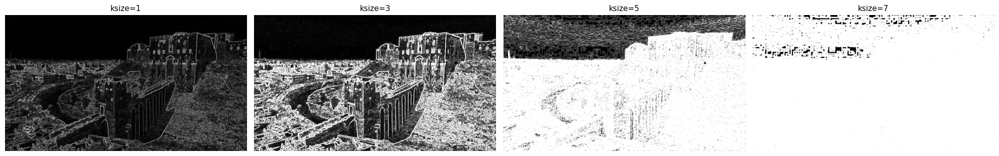

In [29]:
ksizes = [1, 3, 5, 7]
sobel_results = []
for k in ksizes:
    gx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=k)
    gy = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=k)
    magnitude = np.sqrt(gx ** 2 + gy ** 2)
    sobel_results.append(cv2.convertScaleAbs(magnitude))

show_images(sobel_results, [f"ksize={k}" for k in ksizes], cmaps=["gray"] * 4, figsize=(20, 5))


<div dir="rtl" style="text-align: right;">


<h4>الشرح</h4>
<p>نواة أكبر تعني تقدير تدرّج على مساحة أوسع من الجيران، فتصبح الحواف أعرض/أكثر "تمويهاً" وأقل حساسية للضجيج
الدقيق جداً، لكنها أيضاً قد تُفوّت تفاصيل حادّة صغيرة جداً (كحبيبات الحجر) كانت واضحة عند ksize=1 أو 3.</p>


</div>

<div dir="rtl" style="text-align: right; border-right: 5px solid #C97B2E; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 17 — استكشاف <span dir="ltr" style="unicode-bidi: isolate;"><code>apertureSize</code></span> و<span dir="ltr" style="unicode-bidi: isolate;"><code>L2gradient</code></span> في Canny</h2>
<p><strong>🚀 إضافي — بعد الجلسة / للمنزل (النسخة الكاملة فقط)</strong></p>
<p><strong>النوع:</strong> تجربة مصغّرة (Mini Experiment) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 10 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🟡 اختياري</p>
<p><strong>🎯 الهدف التعليمي:</strong> فهم المعاملات الاختيارية الإضافية في Canny التي ذُكرت نظرياً بالأسبوع 3 لكن لم تُستخدَم عملياً.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>احسب Canny بمعامل <span dir="ltr" style="unicode-bidi: isolate;"><code>L2gradient=False</code></span> (الافتراضي) وأيضاً <span dir="ltr" style="unicode-bidi: isolate;"><code>L2gradient=True</code></span>، بنفس العتبات (50, 150)،
وقارن النتيجتين (الفرق سيكون طفيفاً لكن ملحوظاً في الدقة).</li>
<li>جرّب <span dir="ltr" style="unicode-bidi: isolate;"><code>apertureSize=5</code></span> بدل الافتراضي 3، وصف الفرق.</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.Canny(image, t1, t2, apertureSize=3, L2gradient=False)</code></span> — جرّب تغيير كل معامل على حدة.

</details>

</div>

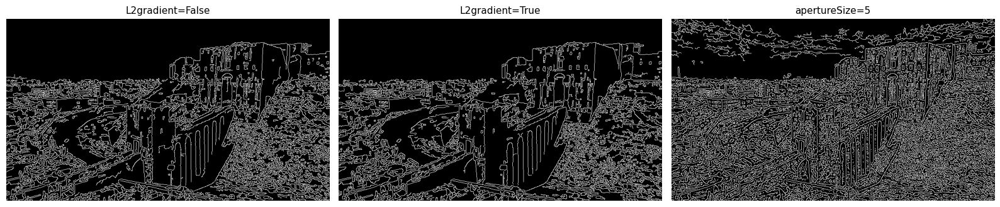

In [30]:
smoothed_opt = cv2.GaussianBlur(img_gray, (5, 5), 0)
edges_l1 = cv2.Canny(smoothed_opt, 50, 150, apertureSize=3, L2gradient=False)
edges_l2 = cv2.Canny(smoothed_opt, 50, 150, apertureSize=3, L2gradient=True)
edges_aperture5 = cv2.Canny(smoothed_opt, 50, 150, apertureSize=5, L2gradient=False)

show_images(
    [edges_l1, edges_l2, edges_aperture5],
    ["L2gradient=False", "L2gradient=True", "apertureSize=5"],
    cmaps=["gray"] * 3, figsize=(16, 5),
)


<div dir="rtl" style="text-align: right; border-right: 5px solid #C97B2E; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 18 — التدفق البصري عملياً: Lucas-Kanade Optical Flow</h2>
<p><strong>🚀 إضافي — بعد الجلسة / للمنزل (النسخة الكاملة فقط)</strong></p>
<p><strong>النوع:</strong> تطبيق مستقل (Independent Application) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 25 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 اختياري</p>
<p><strong>🎯 الهدف التعليمي:</strong> تطبيق طريقة كشف الحركة الثالثة (Optical Flow) التي رآها الطالب نظرياً وعملياً بالأسبوع 3، بشكل مستقل تماماً.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.goodFeaturesToTrack</code></span> لاختيار نقاط بارزة (زوايا) على أول إطار من الفيديو.</li>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.calcOpticalFlowPyrLK</code></span> لتتبّع هذه النقاط عبر بقية الإطارات.</li>
<li>ارسم سهماً (<span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.arrowedLine</code></span>) من موضع كل نقطة القديم إلى موضعها الجديد على كل إطار.</li>
<li>اعرض النتيجة على الإطار الأخير (أو اجمع كل الأسهم على صورة واحدة).</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

راجع <span dir="ltr" style="unicode-bidi: isolate;"><code>feature_params</code></span> و<span dir="ltr" style="unicode-bidi: isolate;"><code>lk_params</code></span> كما استُخدما بالأسبوع 3 كنقطة انطلاق معقولة.

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)</code></span>؛ النقاط الناجحة فقط هي <span dir="ltr" style="unicode-bidi: isolate;"><code>p1[st == 1]</code></span>.

</details>

</div>

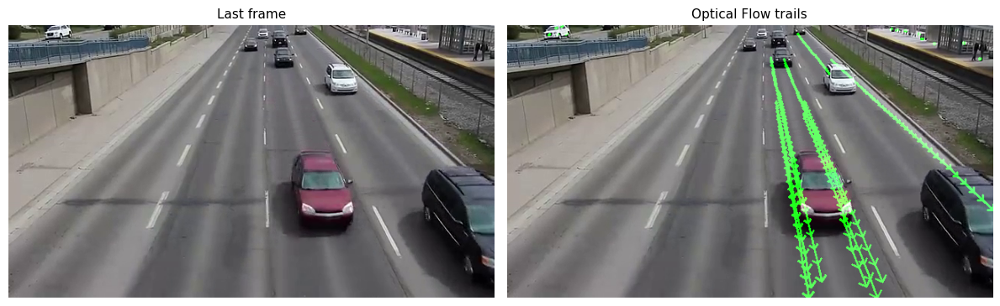

In [31]:
feature_params = dict(maxCorners=60, qualityLevel=0.3, minDistance=7, blockSize=7)
lk_params = dict(winSize=(15, 15), maxLevel=2,
                  criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

old_gray = cv2.cvtColor(video_frames[0], cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
trail_canvas = np.zeros_like(video_frames[0])

for frame in video_frames[1:]:
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    if p0 is None or len(p0) == 0:
        p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
        old_gray = frame_gray.copy()
        continue
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
    if p1 is None:
        p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
        old_gray = frame_gray.copy()
        continue
    good_new = p1[st == 1]
    good_old = p0[st == 1]
    for new, old in zip(good_new, good_old):
        x1, y1 = new.ravel()
        x2, y2 = old.ravel()
        cv2.arrowedLine(trail_canvas, (int(x2), int(y2)), (int(x1), int(y1)), (0, 255, 0), 2, tipLength=0.4)
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2) if len(good_new) > 0 else None

final_view = cv2.add(video_frames[-1], trail_canvas)
show_images([to_rgb(video_frames[-1]), to_rgb(final_view)], ["Last frame", "Optical Flow trails"], figsize=(12, 5))


<div dir="rtl" style="text-align: right; border-right: 5px solid #C97B2E; padding-right: 16px; margin: 26px 0 12px 0;">
<h2>تمرين 19 — توسعة التحدي النهائي: صناديق تحديد حول المركبات</h2>
<p><strong>🚀 إضافي — بعد الجلسة / للمنزل (النسخة الكاملة فقط)</strong></p>
<p><strong>النوع:</strong> تطبيق مستقل (Independent Application) &nbsp;|&nbsp; <strong>المدة التقريبية:</strong> 20 دقيقة &nbsp;|&nbsp; <strong>المستوى:</strong> 🔴 اختياري</p>
<p><strong>🎯 الهدف التعليمي:</strong> إضافة <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.findContours</code></span> لتحويل قناع الحركة (من تمرين 14) إلى صناديق تحديد (Bounding Boxes) واضحة حول كل مركبة، بدل خريطة حواف فقط.</p>
<div dir="rtl" style="text-align: right;">


<h3>المهمة</h3>
<ol>
<li>ابدأ من <span dir="ltr" style="unicode-bidi: isolate;"><code>fg_mask_final</code></span> (قناع الحركة من تمرين 14).</li>
<li>استخدم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.findContours</code></span> لاستخراج الكونتورات (المناطق المتّصلة) من القناع.</li>
<li>تجاهل الكونتورات الصغيرة جداً (ضجيج) بشرط <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.contourArea(cnt) > 500</code></span> مثلاً.</li>
<li>ارسم <span dir="ltr" style="unicode-bidi: isolate;"><code>cv2.rectangle</code></span> حول كل كونتور متبقٍّ فوق الإطار الأصلي.</li>
</ol>


</div>
</div>

<div dir="rtl" style="text-align: right;">

<details dir="rtl">
<summary><strong>💡 تلميح 1</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>contours, _ = cv2.findContours(fg_mask_final, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)</code></span>

</details>

<details dir="rtl">
<summary><strong>💡 تلميح 2</strong></summary>

<span dir="ltr" style="unicode-bidi: isolate;"><code>x, y, w, h = cv2.boundingRect(cnt)</code></span> يُعطيك مباشرة إحداثيات الصندوق المستطيل حول كل كونتور.

</details>

</div>

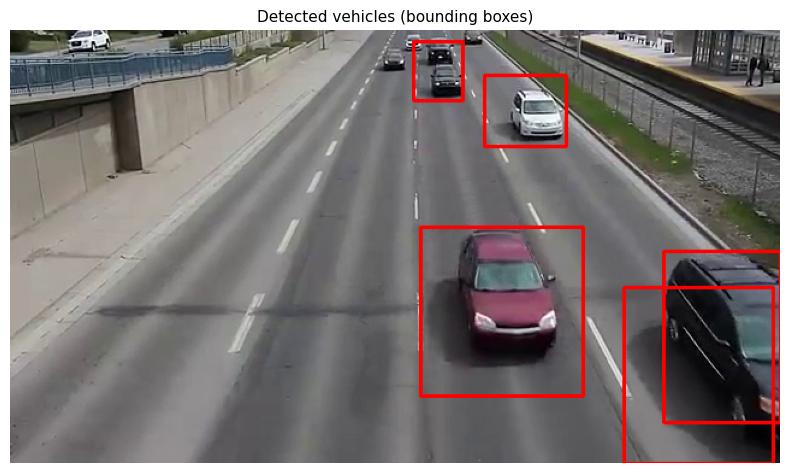

In [32]:
boxed_frame = to_rgb(video_frames[-1]).copy()
contours, _ = cv2.findContours(fg_mask_final, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
for cnt in contours:
    if cv2.contourArea(cnt) > 500:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(boxed_frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

show_images([boxed_frame], ["Detected vehicles (bounding boxes)"], figsize=(8, 6))


<div dir="rtl" style="text-align: right;">


<h2>🙏 شكر وتوثيق المصادر</h2>
<ul>
<li>صور قلعة حلب وأفق مدينة حلب القديمة: مأخوذة من أصول مستودع الكورس (<code>exercises/Week1-2/</code>)، مستخدمة هنا بموافقة ضمنية كموارد تعليمية للكورس نفسه.</li>
<li>فيديو المركبات المارّة: من مستودع موارد دفتر الأسبوع 3 الرسمي (<code>mohres/aleppo-vision-course-assets</code>)، وهو نفس الفيديو المستخدم في تعليم الأسبوع 3 الأصلي.</li>
<li>محتوى الأسبوع 3 المرجعي: دفتر "الأسبوع 3: الرؤية الحاسوبية الكلاسيكية" من مستودع الكورس.</li>
</ul>
<p>للتفاصيل الكاملة عن كل مصدر، راجع <code>INSTRUCTOR_GUIDE.md</code>.</p>


</div>